**Cell 01:** Install scikit-optimize for Hyperparameter Tuning  
**Purpose**  
This cell installs the scikit-optimize (skopt) package, which provides advanced tools for hyperparameter optimization—such as Bayesian search and sequential model-based global optimization—for machine learning projects.

In [ ]:
!pip install scikit-optimize


**Cell 02:** Check PyTorch Installation and CUDA Support  
**Purpose**  
This cell checks that PyTorch is installed correctly, prints the version you are running, and shows whether CUDA (GPU acceleration) is available on your machine.

In [ ]:
import torch
print(f"PyTorch version: {torch.version}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA device: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'None'}")

PyTorch version: <module 'torch.version' from '/usr/local/lib/python3.12/dist-packages/torch/version.py'>
CUDA available: True
CUDA device: Tesla T4


**Cell 03:** Clone the L-GTA Repository and Set Working Directory  
**Purpose**  
This cell downloads the public repository for L-GTA: Latent Generative Modeling for Time Series Augmentation and sets the notebook’s working directory to the main code folder, so that you can use its Python modules and scripts in later cells.

In [ ]:
!git clone https://github.com/luisroque/latent-generative-modeling-time-series-augmentation.git
%cd latent-generative-modeling-time-series-augmentation/lgta


fatal: destination path 'latent-generative-modeling-time-series-augmentation' already exists and is not an empty directory.
/content/latent-generative-modeling-time-series-augmentation/lgta


**Cell 04:** Change to Project Root and Set Python Import Path  
**Purpose**  
This cell ensures your notebook is running from the main directory of the cloned project and sets up the Python import path so you can reliably import modules and packages from the current working directory.

In [ ]:
%cd /content/latent-generative-modeling-time-series-augmentation
import sys
sys.path.append('.')


/content/latent-generative-modeling-time-series-augmentation


**Cell 05:** Installing Dependencies  
**Purpose**  
These cells install all required Python packages for time series modeling, machine learning, and data analysis, ensuring your coding environment has all the libraries you need for your experiments and workflows.

In [ ]:
!pip install torch numpy pandas matplotlib scikit-learn seaborn tqdm

In [ ]:
!pip install fastdtw


In [ ]:
!pip install dtw-python


In [ ]:
!pip install dtaidistance


**Cell 06:** Explore Project Directory Structure  
**Purpose**  
This cell displays the contents of the project’s main directory and its important subfolders. By listing files and folders, you check that the repository was cloned properly and verify where key code modules are stored.

In [ ]:
import os
print(os.listdir())           # Should list: ['lgta', 'README.md', ...]
print(os.listdir('lgta'))     # Should list: ['model', 'feature_engineering', ...]
print(os.listdir('lgta/model'))  # Should list many .py files including 'create_dataset_versions_vae.py'


['LICENSE', '.gitignore', 'README.md', 'data', 'assets', 'model_weights', 'lgta', '.git']
['utils', '__init__.py', 'transformations', 'evaluation', 'model', 'assets', 'tests', 'benchmarks', '__pycache__', 'preprocessing', 'postprocessing', 'visualization', 'e2e', 'experiments', 'feature_engineering']
['create_dataset_versions_vae.py', '__init__.py', 'helper.py', 'hyperparameter_tuning.py', '__pycache__', 'generate_data.py', 'models.py', '.ipynb_checkpoints']


**Cell 07:** Import Class for Baseline CVAE Model Construction  
**Purpose**  
This cell imports the CreateTransformedVersionsCVAE class, which is used for building and managing the baseline CVAE model architecture, including its training, evaluation, and data transformation steps. This class is a main entry point for running experiments with the original L-GTA model.

In [ ]:
from lgta.model.create_dataset_versions_vae import CreateTransformedVersionsCVAE


### Cell 08: Import All Key Modules for Time Series Modeling, Analysis, and Visualization

***

#### Purpose

This cell brings in all the main Python libraries and project modules needed for the baseline L-GTA workflow. These imports support time series data modeling, synthetic data generation, results analysis, and visualization.

***

#### Detailed Notes

- `import matplotlib.pyplot as plt` and `import numpy as np`  
  Import tools for plotting (Matplotlib) and numerical computation (NumPy), which are essential for working with time series data and results visualization.

- Project-specific imports bring in the major tools for modeling and analysis:
    - `CreateTransformedVersionsCVAE`: Main class for building and training the baseline Conditional Variational Autoencoder (CVAE) model.
    - `detemporalize`: Function for reversing time-based feature engineering, useful for reconstructing or viewing de-windowed series.
    - Visualization tools like `plot_transformations_with_generate_datasets`, `plot_series_comparisons`, and `plot_single_time_series` provide convenient ways to visualize transformations, model outputs, and compare series.
    - `generate_datasets`: Routine for creating augmented or benchmark datasets.
    - Evaluation routines such as `standardize_and_calculate_residuals`, `analyze_transformations`, and `plot_residuals_gradient` are used to calculate errors and compare different experiments or methods.
    - Postprocessing tools, including `process_transformations`, `create_prediction_comparison_dataset`, `create_distance_metrics_dataset`, and `create_reconstruction_error_percentage_dataset`, help you prepare and export results for later analysis or reporting.
    - End-to-end processing tools `e2e_transformation` and `compare_diff_magnitudes` allow you to run the full augmentation and comparison workflows from a single function call.

- This cell acts as a toolbox, importing everything you need before running the modeling, generation, and analysis steps for the baseline model.

***

#### Why This Matters

- Having all core imports at once gives you quick access to functions for each stage of the workflow without re-importing in every cell.
- By importing both modeling and evaluation tools, you make the notebook modular and organized—each stage of the experiment can reference these tools as needed.
- Clear separation of visualization, evaluation, and postprocessing routines prepares your workflow for robust experiment tracking and reproducibility.

***

#### Summary

This cell sets up the notebook environment by importing all key L-GTA modules for baseline time series modeling, data transformation, error analysis, and visualization—making all major functions available for immediate use in your experiments.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from lgta.model.create_dataset_versions_vae import (
    CreateTransformedVersionsCVAE,
)
from lgta.feature_engineering.feature_transformations import detemporalize
from lgta.visualization.comparison_analysis import (
    plot_transformations_with_generate_datasets,
    plot_series_comparisons,
    plot_single_time_series,
)
from lgta.model.generate_data import generate_datasets
from lgta.evaluation.evaluation_comparison import (
    standardize_and_calculate_residuals,
    analyze_transformations,
    plot_residuals_gradient,
)
from lgta.postprocessing.postprocessing_comparison import (
    process_transformations,
    create_prediction_comparison_dataset,
    create_distance_metrics_dataset,
    create_reconstruction_error_percentage_dataset,
)
from lgta.e2e.e2e_processing import e2e_transformation, compare_diff_magnitudes


### Cell 09: Set Dataset, Frequency, and Scope for Baseline Experiments

***

#### Purpose

This cell configures which time series dataset, temporal frequency, and series filtering will be used in your modeling and augmentation experiments. It gives you control over the main data source and how much of it to use, so your code and results stay consistent.

***

#### Detailed Notes

- `dataset = "tourism"`  
  This sets your main dataset to the Tourism forecasting collection, which is a common benchmark for time series augmentation studies.  
  - The tourism dataset features hundreds of series, including monthly, quarterly, and yearly data contributed by tourism boards and academic researchers.[2][4][7]
  - For monthly frequency, it includes 366 series, each with about 298–330 data points according to public descriptions.[4][7]

- `freq = "M"`  
  This sets the time series frequency to **monthly**.  
  - Monthly frequency is standard for comparing seasonal and forecasting models in tourism research and competitions.[2][4]

- `top = None`  
  By setting `top` to `None`, all series in the dataset will be used, rather than just a subset of the top N.

- The cell also provides commented-out options for alternative datasets:
  - **M5 dataset:** If used, change `dataset` to `"m5"`, set `freq` to weekly (`"W"`), and restrict the number of series to 500.
  - **Police dataset:** If used, change `dataset` to `"police"`, set `freq` to daily (`"D"`), and also use the top 500 series.

***

#### Why This Matters

- Choosing dataset and frequency is one of the first steps in any experiment. It determines the data structure, seasonal patterns, and prediction horizons you’ll work with.
- Setting these options centrally keeps experiments well-documented and reproducible—you and others can see what data settings were used for every run.
- The Tourism dataset is a standard in time series research, so these settings let you compare results with published benchmarks and competitions.

***

#### Summary

This cell selects the dataset (Tourism, monthly frequency) and determines how many series to include in baseline modeling and augmentation experiments. Adjusting these parameters is essential for framing your experiment and keeping your analysis consistent and comparable with past research.

In [ ]:
dataset = "tourism"
freq = "M"
top = None

# For M5 dataset
# dataset = "m5"
# freq = "W"
# top = 500

# For police dataset
# dataset = "police"
# freq = "D"
# top = 500


### Cell 10: Prepare Directory for Saving Raw Data and Define Model Weights Path

***

#### Purpose

This cell sets up the required directory for storing original datasets and defines the filepath where the trained model's weights will be saved. This organization supports future saving, loading, and reproducibility of both data and models.

***

#### Detailed Notes

- `import os`  
  - Loads Python's operating system interface, which is used to create folders and manage file paths.

- `os.makedirs('assets/data/original_datasets', exist_ok=True)`
  - Creates the directory `'assets/data/original_datasets'` and any necessary parent folders.
  - The `exist_ok=True` option (available since Python 3.2) prevents an error if the directory already exists—it will simply do nothing in that case.[1][2][3][6]
  - This directory is intended for saving raw, unmodified versions of your datasets, making it easier to reference or reuse them in future experiments.

- `save_path = f"model_weights/tourism_vae.weights.h5"`
  - Sets a standardized filepath for saving model weights after training.
  - The path `"model_weights/tourism_vae.weights.h5"` will store weights in HDF5 format, specific to the tourism dataset and VAE model.
  - This ensures that all versions of saved models have clear, organized locations, simplifying model management and sharing.

***

#### Why This Matters

- Ensures that experiment outputs—original data and model weights—are saved to stable, predictable locations, preventing accidental loss or confusion.
- Makes later workflows (loading data/models, sharing results) much easier and less error-prone.
- Central to reproducibility and organization in machine learning projects—good file management helps you and others keep experiments structured and traceable.

***

#### Summary

This cell creates a directory for storing original datasets and sets the filepath for saving model weights, laying the groundwork for organized data management and model checkpointing throughout your experiments.

In [ ]:
import os
os.makedirs('assets/data/original_datasets', exist_ok=True)

In [ ]:
save_path = f"model_weights/tourism_vae.weights.h5"

### Cell 11: Train the Baseline CVAE Model and Generate Reconstructions

***

#### Purpose

This cell sets up and trains the baseline CVAE (Conditional Variational Autoencoder) model using the dataset and parameters you previously specified. It then uses the trained model to produce reconstructed time series and to generate their latent representations for later analysis.

***

#### Detailed Notes

- `create_dataset_vae = CreateTransformedVersionsCVAE(dataset_name=dataset, freq=freq, top=top, dynamic_feat_trig=False)`
  - Creates an instance of the main modeling class for this project, specifying:
    - `dataset_name=dataset`: Which dataset to use (based on settings from previous cells, such as "tourism"),
    - `freq=freq`: The time series frequency (e.g., monthly, weekly, or daily),
    - `top=top`: The number of "top" series to select (or all, if `None`).
    - `dynamic_feat_trig=False`: Disables dynamic feature engineering for now, focusing only on the core time series as input.
  - This object handles all the essential data preprocessing and modeling steps.

- `model, _, _ = create_dataset_vae.fit()`
  - Fits (trains) the CVAE model on your selected dataset. The function returns:
    - `model`: The trained model object,
    - `_`: Additional outputs, such as training history or callbacks, are ignored with underscores here.

- `X_hat, z, _, _ = create_dataset_vae.predict(model)`
  - Uses the trained model to generate predicted (reconstructed) time series (`X_hat`) from the latent space.
  - Also produces the latent representations (`z`) for each sequence, which can be used for further analysis or visualization.
  - The final two underscores ignore any extra info not needed in this step.

***

#### Why This Matters

- This cell **trains the main baseline model** and produces reconstructed outputs, both of which are needed for all error metrics, comparisons, and plots you’ll generate later.
- Storing the latent variables allows you to investigate what the model "learns" about each time series and supports additional tasks like generating new synthetic series.
- Running training and prediction before moving to analysis ensures all downstream evaluations are based on your latest model and experiment configuration.

***

#### Summary

This cell prepares the baseline CVAE model, fits it to your chosen dataset, and then predicts reconstructed series along with their latent codes. These results are the starting point for further evaluation, visualization, and synthetic data experiments in the rest of your notebook.

In [ ]:
create_dataset_vae = CreateTransformedVersionsCVAE(
    dataset_name=dataset, freq=freq, top=top, dynamic_feat_trig=False
)
model, _, _ = create_dataset_vae.fit()
X_hat, z, _, _ = create_dataset_vae.predict(model)


/content/latent-generative-modeling-time-series-augmentation/lgta/model/create_dataset_versions_vae.py:119: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.df.asfreq(self.freq)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "cvae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_CVAE (Functional)       │ ((None, 2), (None, 2), │     4,622,902 │
│                                 │ (None, 2))             │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_CVAE (Functional)       │ (None, 10, 304)        │    10,005,856 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,628,758 (55.80 MB)

 Trainable params: 14,628,146 (55.80 MB)

 Non-trainable params: 612 (2.39 KB)

### Cell 12: Plot Original vs. Reconstructed Time Series (First Series)

***

#### Purpose

This cell creates a plot comparing the original time series data to the reconstructed output produced by the baseline CVAE model, focusing on the first series in the dataset. It helps visually check whether the model is able to capture and reproduce the main patterns in the data.

***

#### Detailed Notes

- `X_orig = create_dataset_vae.X_train_raw`
  - Retrieves the original, unmodified time series used for training from the model management object.

- `X_hat_orig = X_hat`
  - Assigns the model’s reconstructed outputs, so you can plot them clearly alongside the originals.

- The plotting section:
  - `plt.figure(figsize=(10, 4))`  
    Sets up a wide plot to visualize the series.
  - `plt.plot(X_hat_orig[:, 0], label="reconstructed")`  
    Plots the reconstructed data for the first time series.
  - `plt.plot(X_orig[:, 0], label="original")`  
    Plots the original data for the same series.
  - `plt.legend()`  
    Adds a legend so viewers can see which line is which.
  - `plt.title("Original vs Reconstructed Time Series (first series)")`  
    Gives context to the plot for easier interpretation.
  - `plt.show()`  
    Renders the plot, making the comparison visible.

***

#### Why This Matters

- Visual comparison between original and reconstructed data is a key first sanity check for any generative model—it helps you see if the model is learning major trends, seasonality, or other characteristics of the true data.
- If the lines are close, it suggests the model’s latent space can effectively encode and reproduce the series. Large differences may point to underfitting, overfitting, or other modeling issues.
- This step lays the foundation for more detailed quantitative analysis with metrics and error measurements.

***

#### Summary

This cell plots the first time series from both the original data and the CVAE’s reconstruction on the same graph. It’s a straightforward way to see, at a glance, how well your baseline model is mimicking the shape and features of the real data.

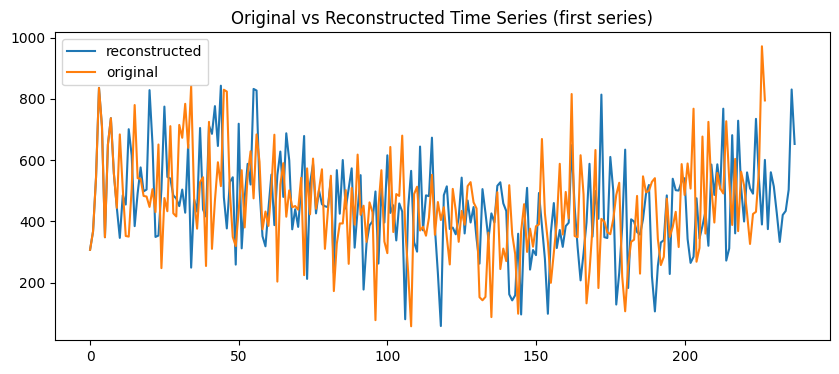

In [ ]:
X_orig = create_dataset_vae.X_train_raw
X_hat_orig = X_hat

plt.figure(figsize=(10, 4))
plt.plot(X_hat_orig[:, 0], label="reconstructed")
plt.plot(X_orig[:, 0], label="original")
plt.legend()
plt.title("Original vs Reconstructed Time Series (first series)")
plt.show()


### Cell 13: Define Transformation Settings for Visualization

***

#### Purpose

This cell sets up a list of transformation configurations—specifically, "jitter" (adding noise) and "magnitude_warp" (smoothly warping magnitudes using splines)—that will be used to augment time series for qualitative visualizations and side-by-side analysis in later steps.

***

#### Detailed Notes

- `transformations_plot = [...]`
  - Creates a list of dictionaries where each dictionary contains configuration for a particular transformation method.
  
- **First transformation:**
  - `"transformation": "jitter"`  
    - Jittering adds random Gaussian noise to each value in the series. This technique is simple but useful for simulating natural variability and making models more robust.[5]
    - `"params": [0.5, 0.5, 0.5, 0.5]`  
      - The parameters most likely specify the standard deviation of the Gaussian noise for each series or group.
  - `"parameters_benchmark": {...}`
    - Lists standard parameters for different augmentation methods. For jittering, `jitter: 0.5` means noise is added with standard deviation 0.5.
  - `"version": 5`
    - A version identifier for tracking or reproducibility.

- **Second transformation:**
  - `"transformation": "magnitude_warp"`  
    - Magnitude warping modifies the amplitude of the series by smoothly scaling with a cubic spline, introducing more flexible and local variations while preserving overall structure.[2][5]
    - `"params": [0.1, 0.1, 0.1, 0.1]`
      - Likely controls the standard deviation or intensity of the magnitude warping effect.
  - `"parameters_benchmark": {...}`
    - The benchmark parameters allow for direct comparison between this run and standard reference settings used in published studies or internal baselines.
  - `"version": 4`
    - Another version identifier for tracking.

- These settings will be passed to plotting and dataset generation functions, making it easy to produce visualizations for each augmentation type.

***

#### Why This Matters

- Clearly defines how the notebook will augment or transform series for visualization and qualitative checks—an essential step for transparent experiment design.
- Using parameter dictionaries prepared up front allows for easy extension, modification, and reproducibility (for example, if you want to compare results with different levels of jitter or magnitude warp in the future).
- This approach supports both visual inspection and later, more formal, metric comparisons between baseline and augmented series.[5]

***

#### Summary

This cell defines the transformation settings (jittering and magnitude warping) and their parameters to be used for visual analysis of augmented time series data. With this, you can easily generate, compare, and document various augmentation effects in your workflow.

In [ ]:
transformations_plot = [
    {
        "transformation": "jitter",
        "params": [0.5, 0.5, 0.5, 0.5],
        "parameters_benchmark": {
            "jitter": 0.5,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 5,
    },
    {
        "transformation": "magnitude_warp",
        "params": [0.1, 0.1, 0.1, 0.1],
        "parameters_benchmark": {
            "jitter": 0.5,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 4,
    },
]


### Cell 14: Visualize Augmented and Model-Generated Time Series Transformations

***

#### Purpose

This cell generates and displays visualizations showing how original, augmented, and model-generated (or reconstructed) time series look under different transformations (like jitter and magnitude warp). It helps you quickly see the effects of augmentation and the quality of reconstructions side-by-side, supporting both qualitative and intuitive comparative analysis.

***

#### Detailed Notes

- `plot_transformations_with_generate_datasets(...)`
  - Calls a visualization routine that takes your original dataset, the trained model, transformation configurations, and generates plots for selected time series.
  - Arguments include:
    - `dataset`, `freq`: The source dataset and its time granularity.
    - `generate_datasets`: The function that creates augmented versions and model outputs for visualization.
    - `X_orig`: The raw, original time series.
    - `model`, `z`, `create_dataset_vae`: Trained model and its latent codes, plus the handling object for preprocessing.
    - `transformations=transformations_plot`: The list of transformation settings you defined earlier.
    - `num_series=4`: Number of series to display for each transformation, giving a broad visual sample.

- What the plot shows:
  - Classic **line charts** (the preferred standard for time series visualization), with time on the x-axis and values on the y-axis.[1][3][4][7]
  - For each transformation, you see the original, augmented, and model-produced (reconstructed or synthetic) series, often stacked or overlapped for direct side-by-side comparison.
  - Clear legends and titles help distinguish the transformation mode and which series is which.

***

#### Why This Matters

- Visualization is a key step in time series data analysis—it lets you catch patterns, outliers, and general effects of augmentation FAR more quickly than pure metrics.
- By charting both original and augmented versions, you can see whether the transformation methods produce plausible, varied, and realistic data.
- Visual checks help you decide whether the model architecture generalizes well and whether it learns enough structure to handle noisy or warped input.

***

#### Summary

This cell creates line plots that compare original, augmented, and reconstructed time series for each selected transformation. It's a crucial step for understanding the practical and visual impact of synthetic data generation and augmentations, and for communicating results to others.

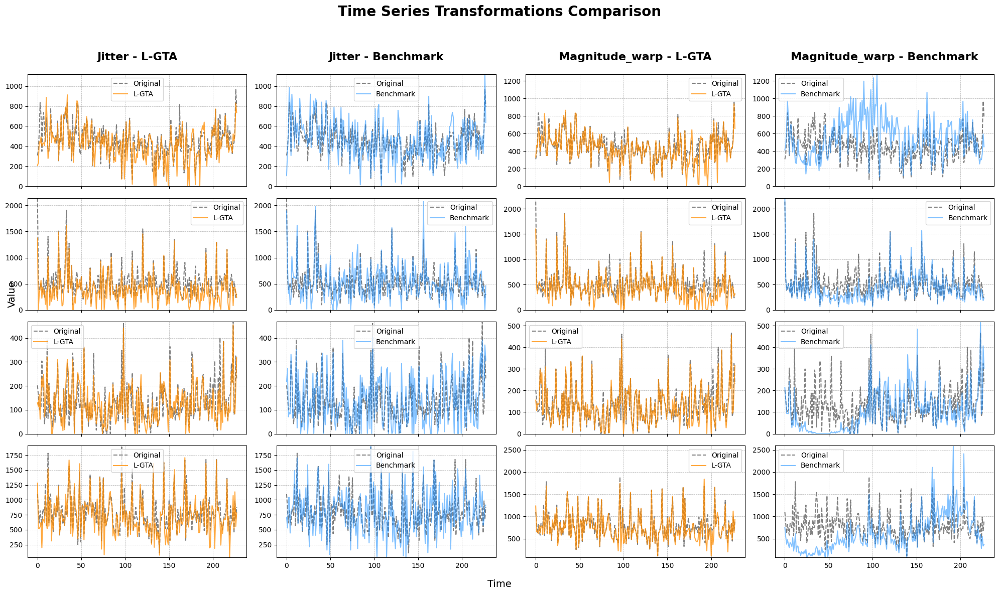

In [ ]:
plot_transformations_with_generate_datasets(
    dataset=dataset,
    freq=freq,
    generate_datasets=generate_datasets,
    X_orig=X_orig,
    model=model,
    z=z,
    create_dataset_vae=create_dataset_vae,
    transformations=transformations_plot,
    num_series=4,
)


### Cell 15: Plot Individual Time Series Under Different Transformations

***

#### Purpose

This cell displays single time series samples after applying various transformations (like jittering and magnitude warp) as well as reconstructions from the baseline CVAE model. The main goal is to help you visually inspect how each transformation affects the series and how well the model output matches or differs from the augmented data.

***

#### Detailed Notes

- `plot_single_time_series(...)`
  - Calls a visualization function that produces line plots for individual time series.
  - Uses the original dataset and frequency settings (`dataset`, `freq`).
  - Passes the function for generating augmented/model datasets (`generate_datasets`).
  - Supplies both the raw original (`X_orig`) and the trained model and latent features (`model`, `z`, `create_dataset_vae`).
  - References the list of transformation configurations you set up previously in `transformations_plot`.
  - `num_series=4` tells the function to plot four different series for each selected transformation.

- What you get:
  - For each selected transformation, you see a chart showing the original, transformed/augmented, and reconstructed series for up to four individual samples.
  - These are typically rendered as line plots with legends, where x-axis is time and y-axis is the observed value.[1][5][7]
  - Each series in a subplot helps you spot where transformations make major changes, and whether the model output tracks the true or augmented data.

***

#### Why This Matters

- Plotting single series after different transformations gives direct, intuitive feedback about the realism and diversity of synthetic data.
- These plots help catch overfitting, underfitting, or cases where augmentation hurts instead of helps model performance.
- Visual checks are a complement to metric-based evaluation—you can often spot subtle issues in plots that metrics alone won’t reveal.

***

#### Summary

This cell creates separate plots for individual time series samples, showing how each transformation (jittering, magnitude warp) and model reconstruction appears. It is an essential part of assessing augmentation quality and the model’s ability to reproduce or generalize realistic data.

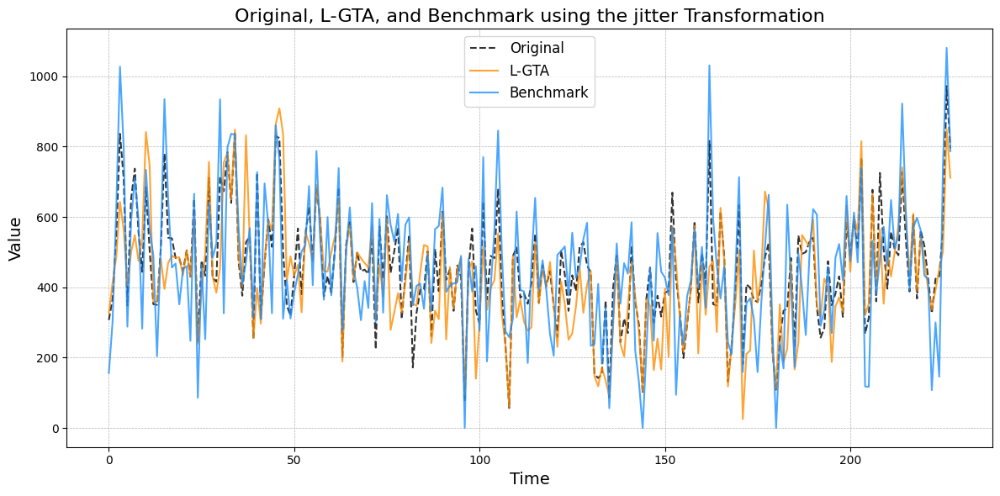

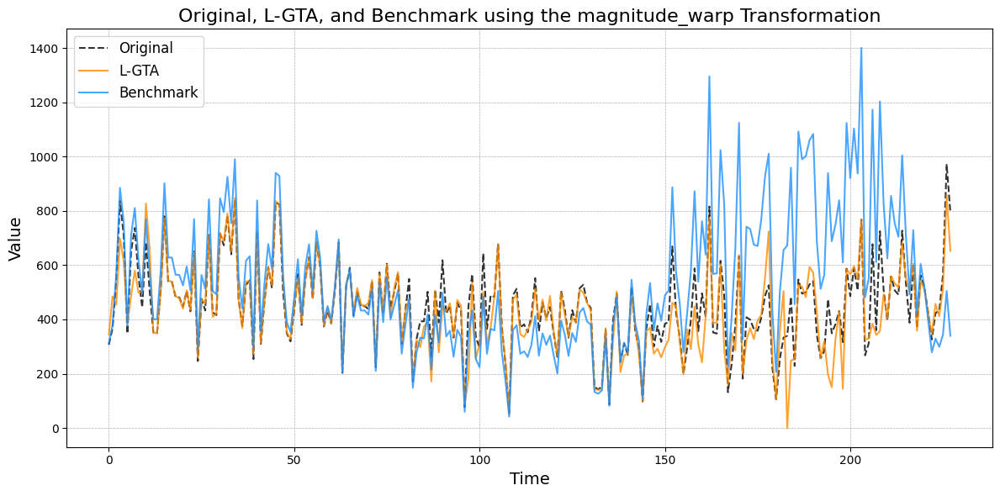

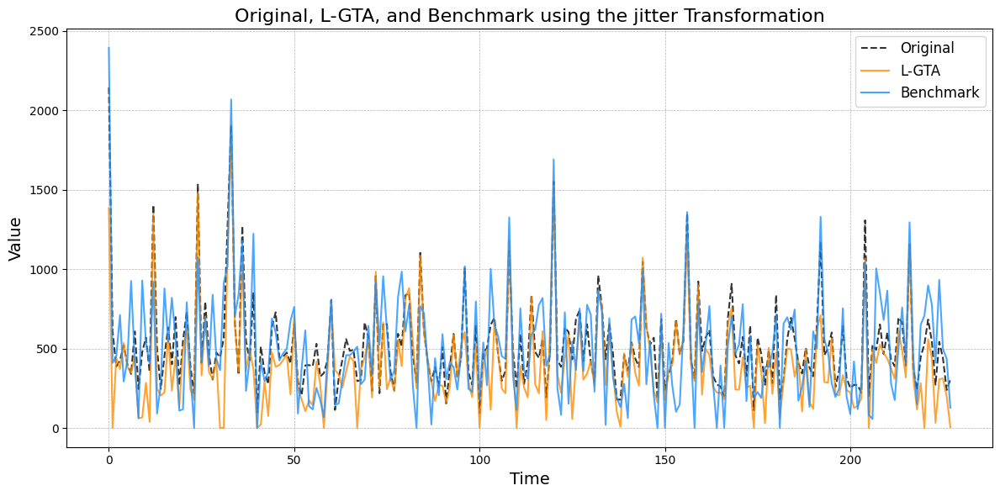

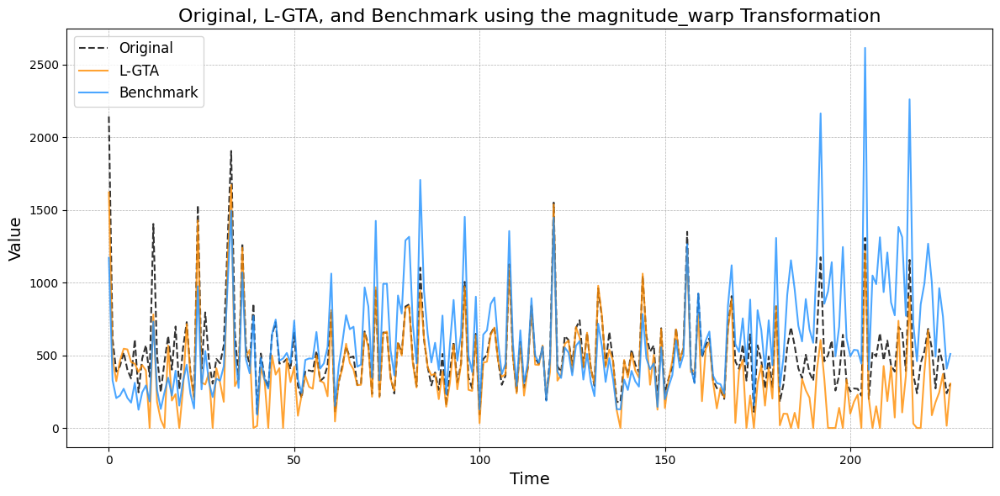

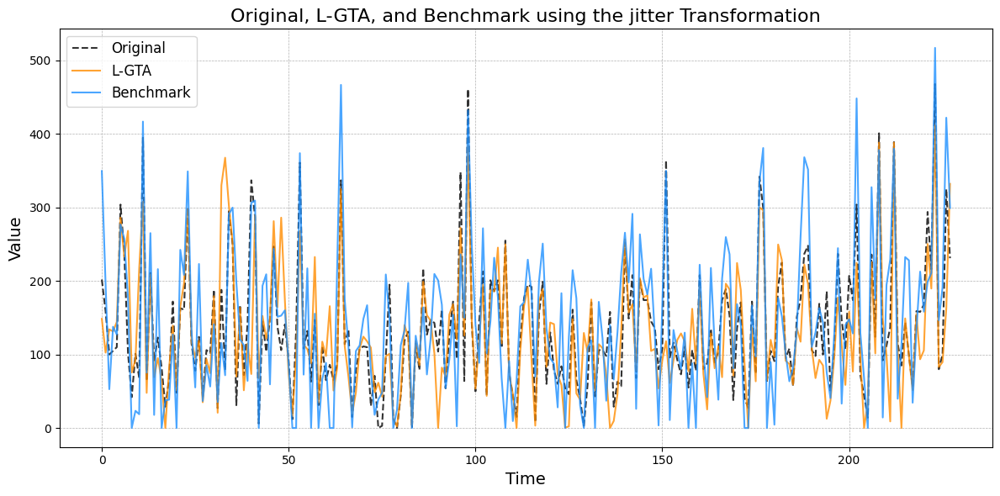

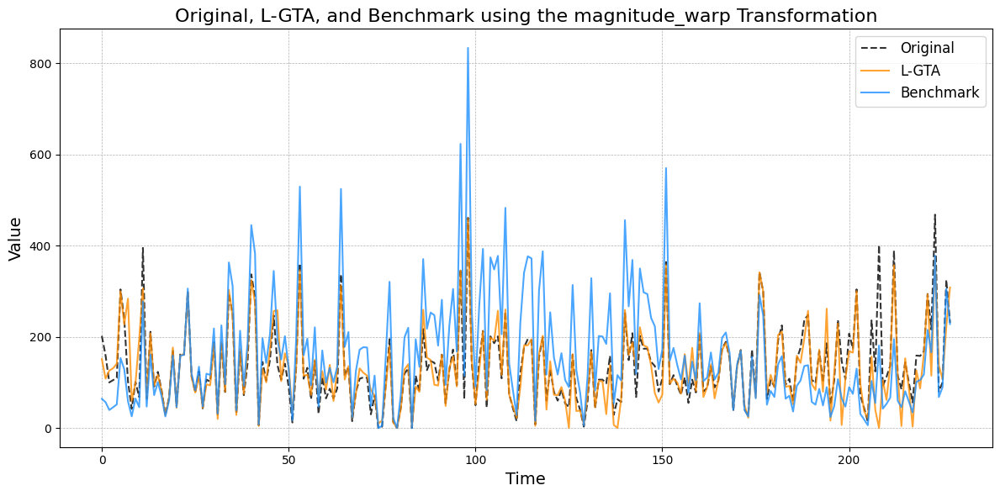

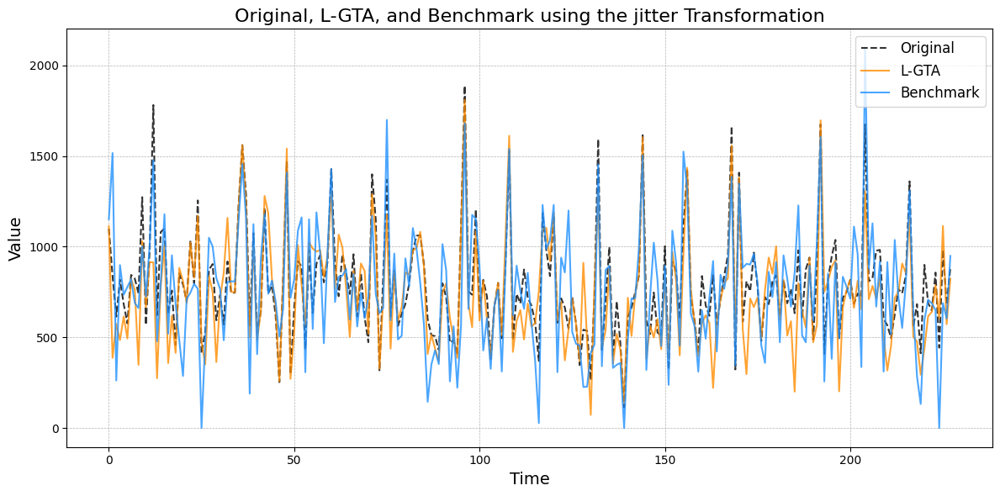

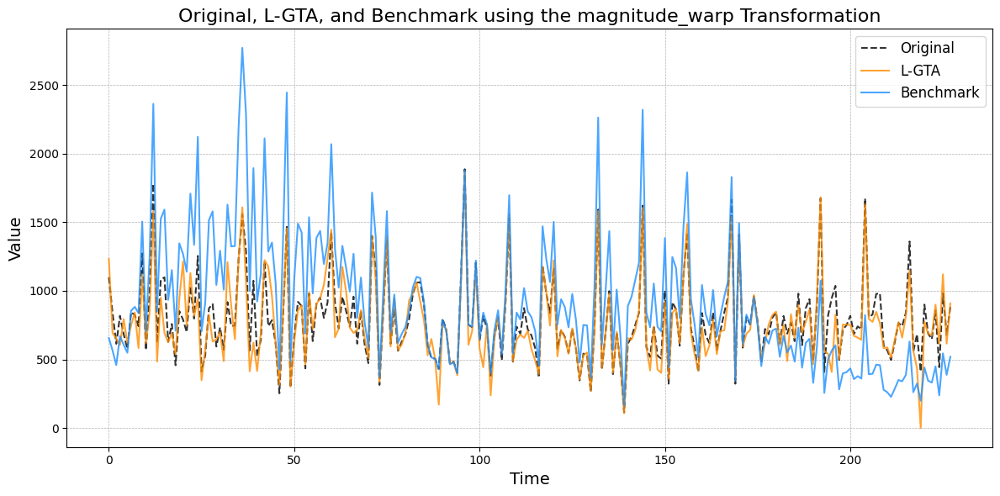

In [ ]:
plot_single_time_series(
    dataset=dataset,
    freq=freq,
    generate_datasets=generate_datasets,
    X_orig=X_orig,
    model=model,
    z=z,
    create_dataset_vae=create_dataset_vae,
    transformations=transformations_plot,
    num_series=4,
)


### Cell 16: Compare Magnitude Differences Between Original and Model Series

***

#### Purpose

This cell visualizes and analyzes the **magnitude differences** between your original time series and the ones generated or reconstructed by your model. This helps you see if your synthetic or reconstructed data matches the typical scale and amplitude of the real data, or if it consistently under- or overshoots values.

***

#### Detailed Notes

- `compare_diff_magnitudes(...)`
  - This function takes the main arguments:
    - `dataset`, `freq`: The dataset you're exploring and its time resolution.
    - `model`, `z`, `create_dataset_vae`: The trained model and its latent codes, plus your data handling object.
    - `X_orig`: The original input time series data.
  - It typically generates **plots** (such as line charts or area charts) placing original and model-generated series side by side or even overlayed, making magnitude differences instantly visible.
  - May include summary tables of key statistics (like mean, variance, or amplitude) for both the original and generated series, helping you spot if the generated data is too “flat” or “wild.”

- **Why visualize magnitude?**
  - If a model can't reproduce the right scale or amplitude of real series, any synthetic or reconstructed data will be unrealistic.
  - Both visual plots (especially **line charts** for time series, possibly with multiples plotted for direct comparison) and summary statistics are standard to report for this check.[2][3][4]

***

#### Why This Matters

- This is an essential part of evaluating any generative time series model. If your synthetic data doesn’t match the real data’s magnitude, downstream models and analyses could be biased or misleading.
- Realistic magnitudes make data augmentation, forecasting, and downstream analytics much more trustworthy—so this kind of check is highly recommended in both academic and applied time series work.
- Line charts or area charts are the clearest and most accepted ways to make these comparisons visually, making it easy to spot mismatches at a glance.[3][4][2]

***

#### Summary

This cell generates visual and statistical comparisons of the magnitudes in your original and generated time series. It helps you assess whether your model preserves the natural scale and amplitude of the data, which is crucial for trustworthy synthetic data generation in time series modeling.

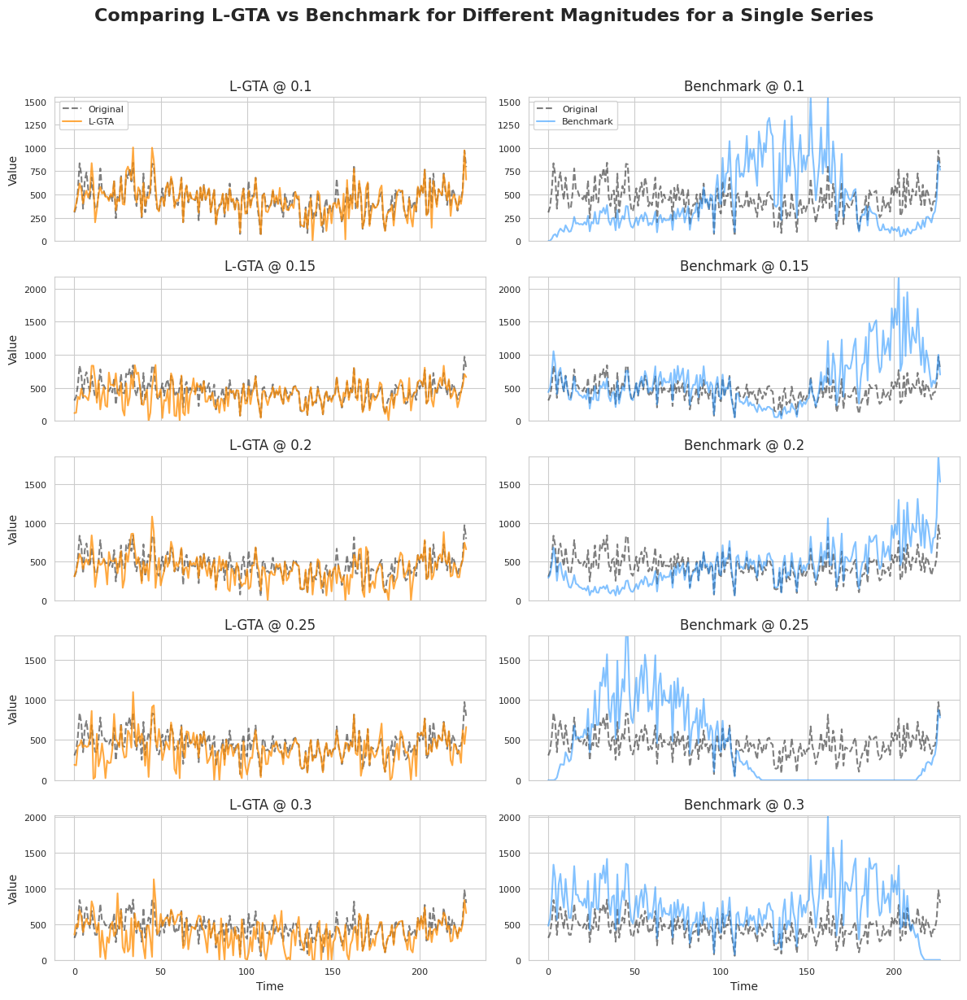

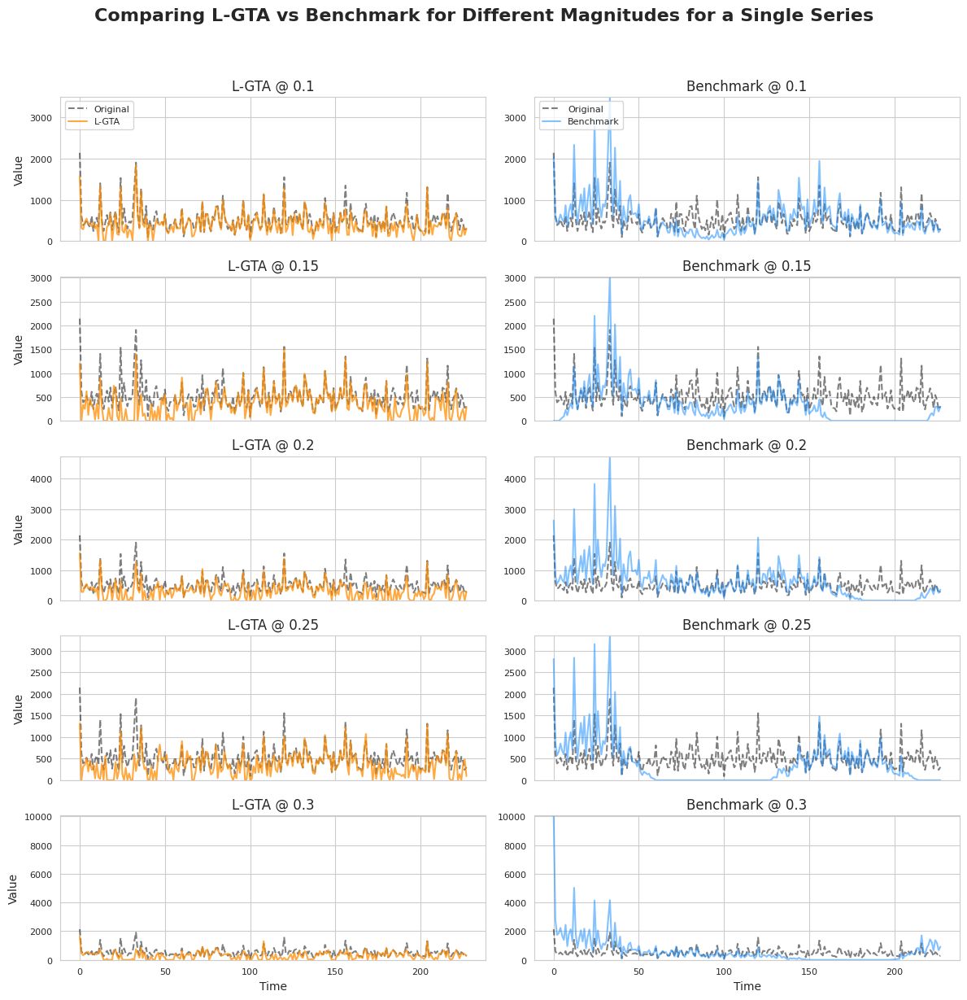

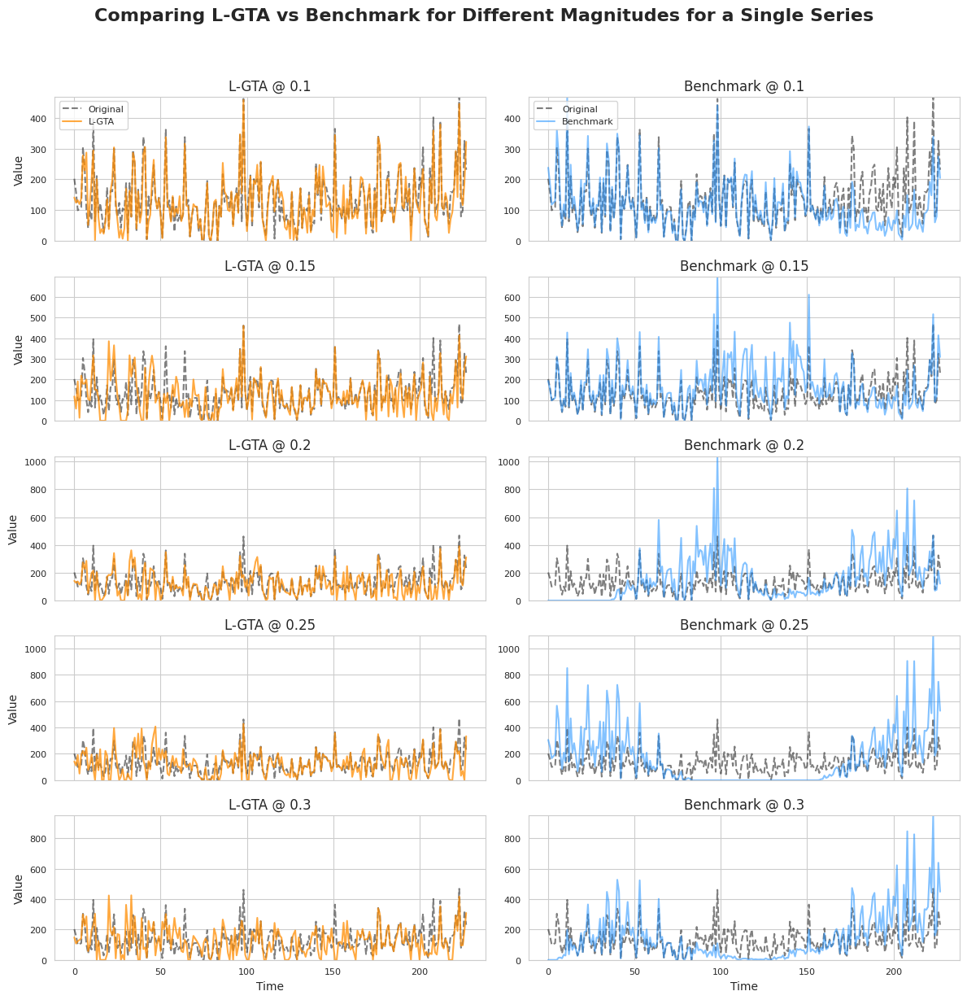

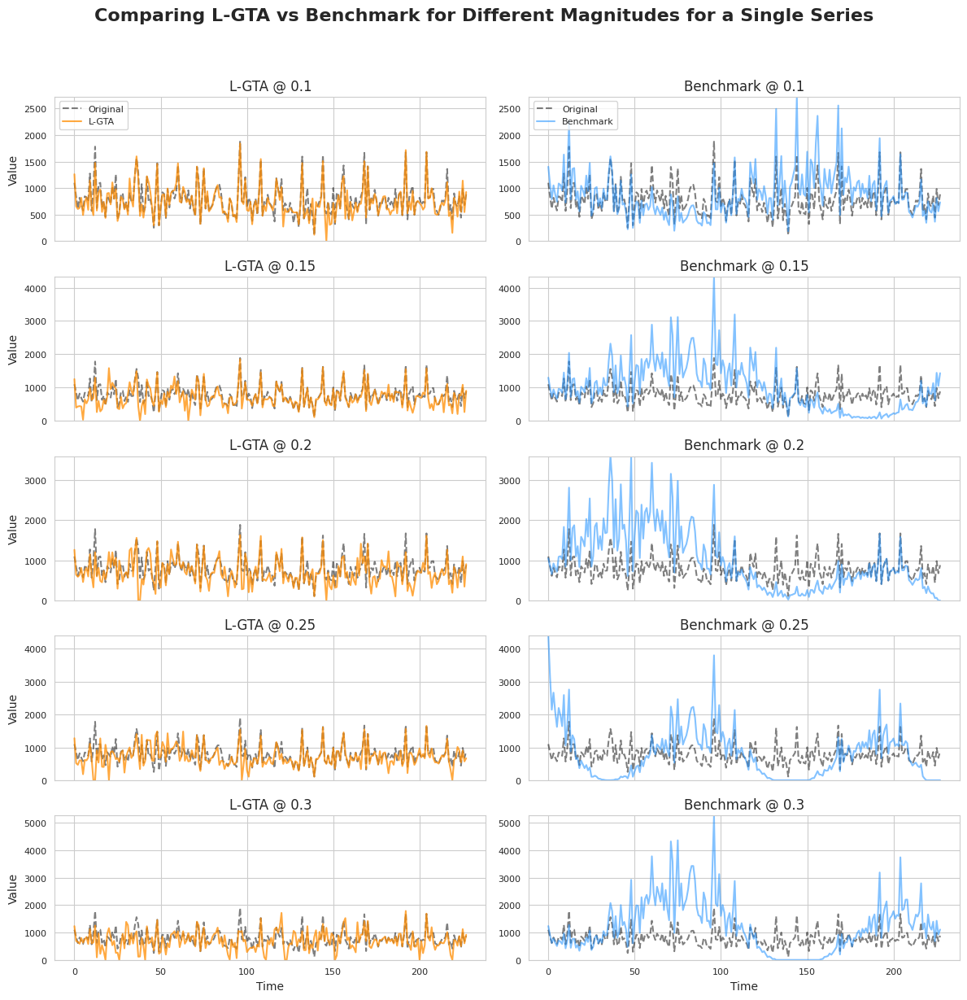

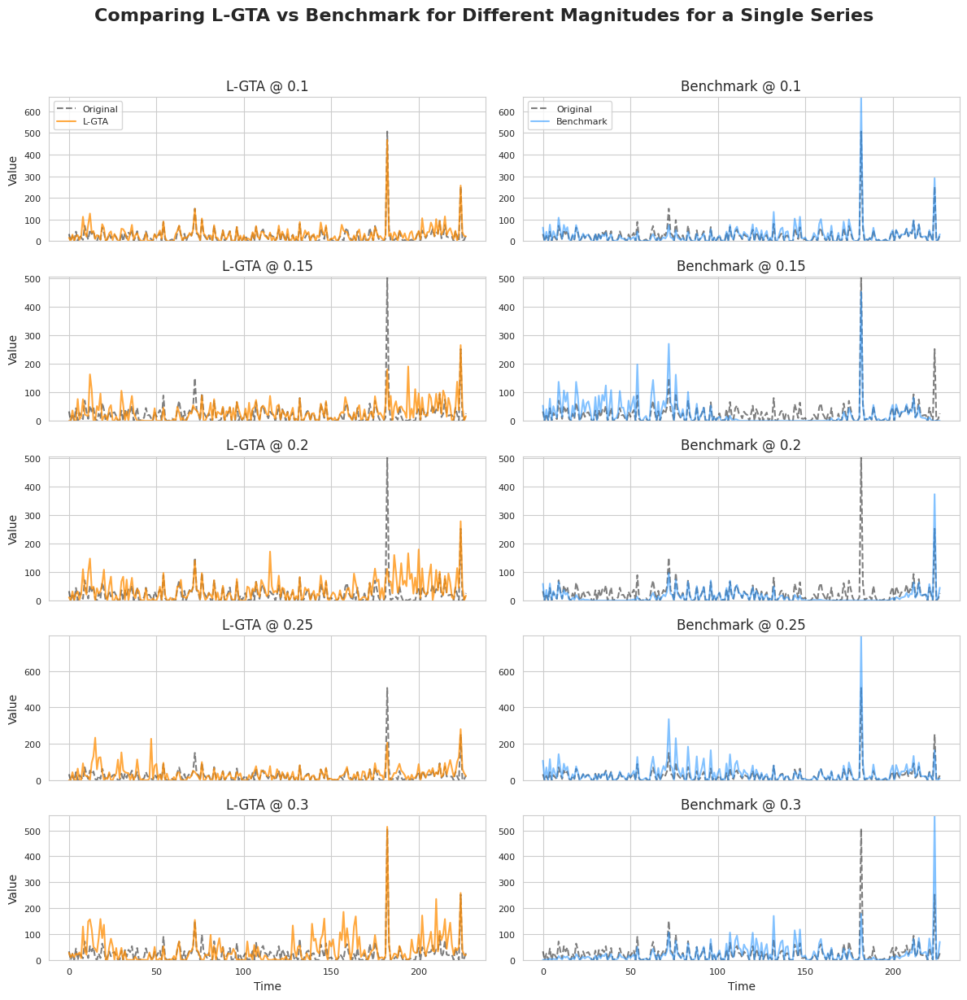

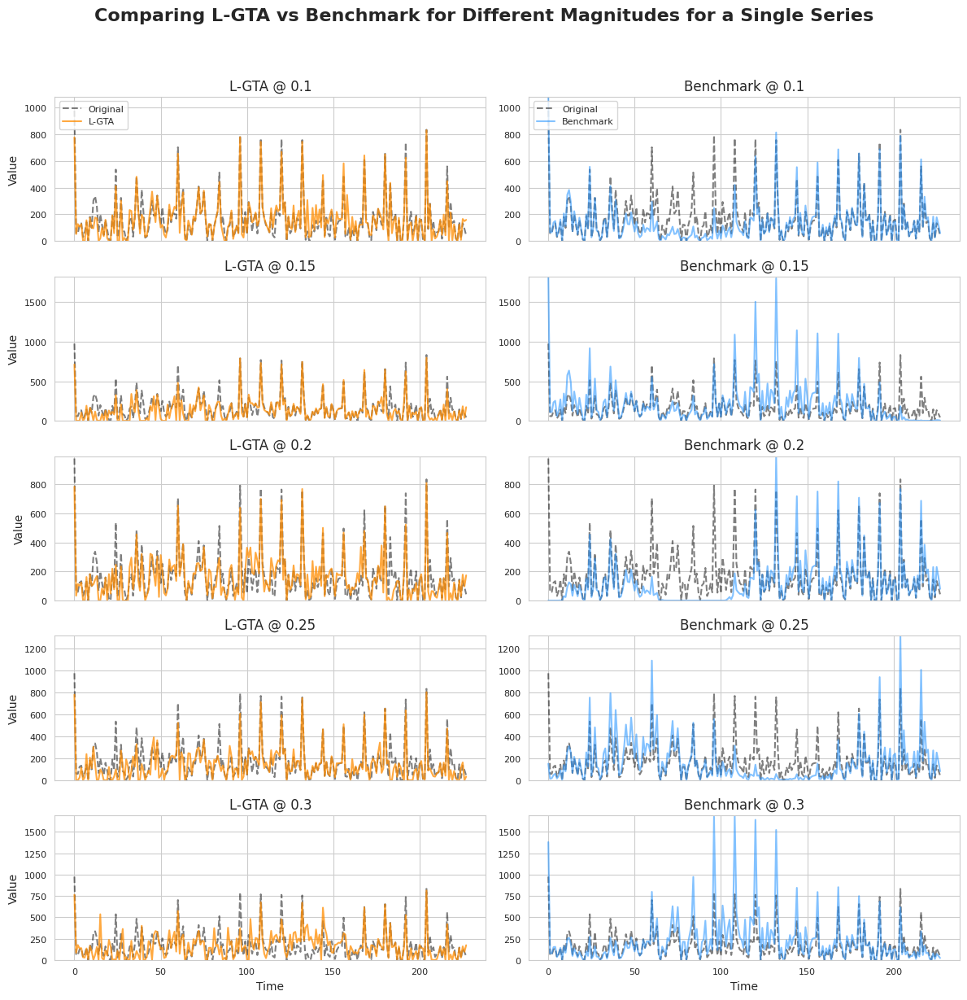

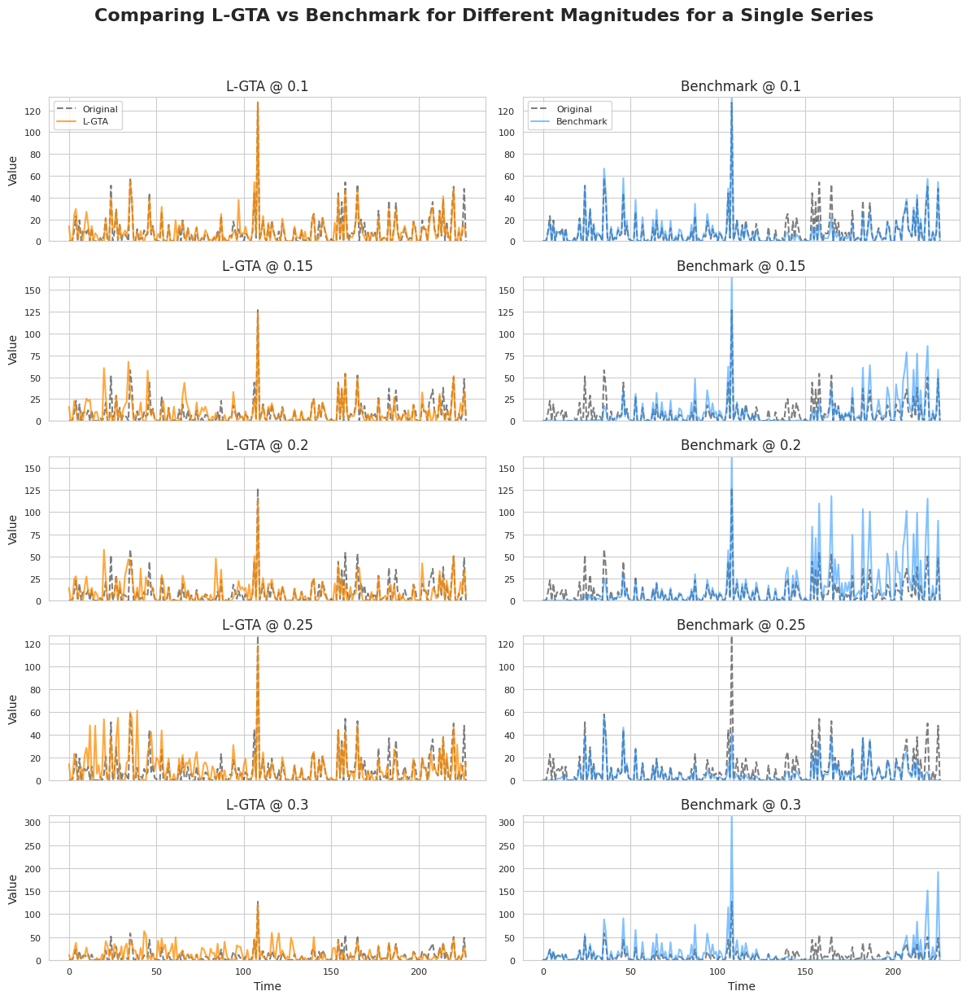

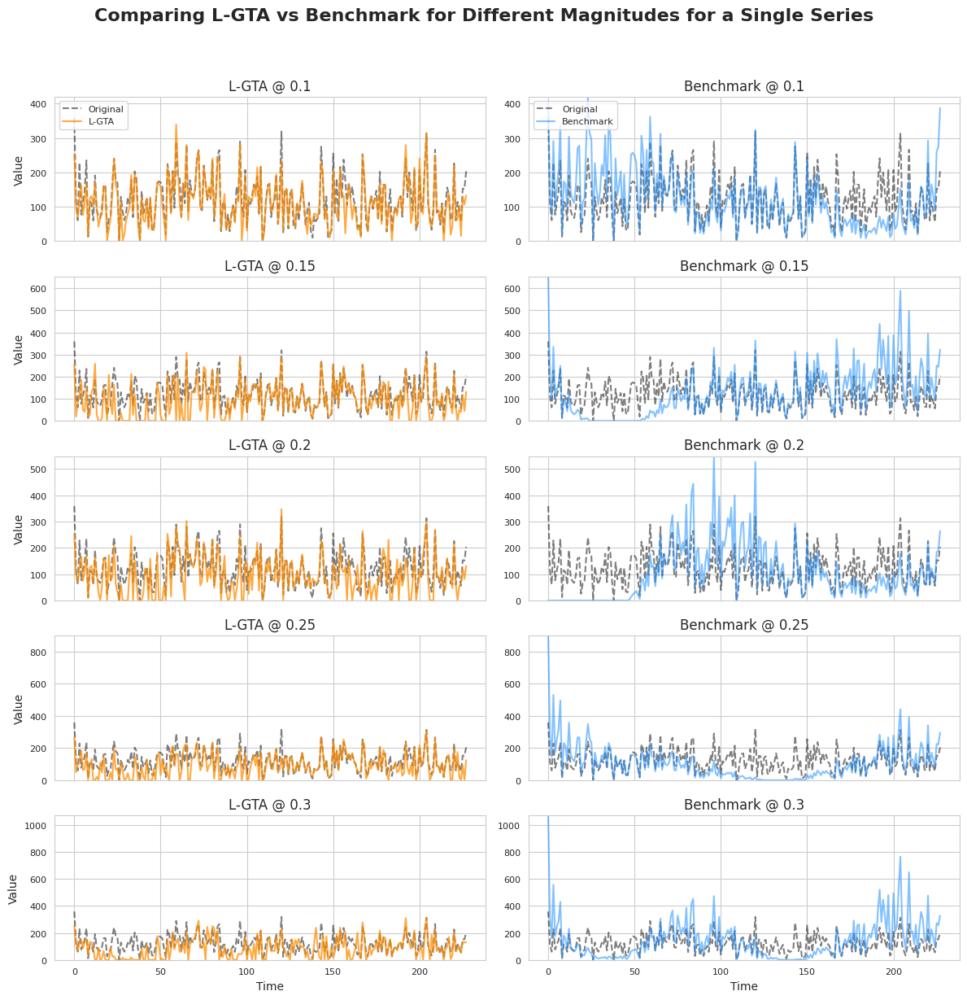

In [ ]:
compare_diff_magnitudes(
    dataset,
    freq,
    model,
    z,
    create_dataset_vae,
    X_orig,
)


### Cell 17: Define Core Time Series Data Augmentation Transformations

***

#### Purpose

This cell sets up a list of key data augmentation transformations—**jitter**, **scaling**, and **magnitude_warp**—with their main parameters and reference (benchmark) settings. These options will be used to artificially increase the training dataset by slightly altering the time series, making models more robust and improving generalization.[1][5][7]

***

#### Detailed Notes

- **Transformations List**
  - Each entry in the `transformations` list is a dictionary that configures:
    - `"transformation"`: The type of augmentation applied.
    - `"params"`: Main parameter(s) controlling the transformation's strength.
    - `"parameters_benchmark"`: Provides standard settings for each augmentation type, so experiments can be compared consistently.
    - `"version"`: Marks the transformation setup for clarity and reproducibility.

- **Transformation Types Used**:
  - `"jitter"`  
    - Adds random noise (usually Gaussian) to each data point, helping the model handle minor variations (noise injection is a basic but important time series augmentation tool).[6][7]
  - `"scaling"`  
    - Multiplies the signal by a random factor, letting the model learn to be robust to variations in amplitude or measurement units.[6]
  - `"magnitude_warp"`  
    - Smoothly warps the amplitude using a function like a spline, creating more subtle and realistic variations in how the signal’s peaks and valleys appear.

- Each transformation method is widely recommended in current research and helps to address overfitting, generalization, and sometimes class imbalance in time series tasks.[5][7]

***

#### Why This Matters

- Setting these parameters up front allows for systematic and reproducible data augmentation across experiments.
- Augmenting your dataset with controlled randomness and scaling improves the ability of models to learn useful patterns and decreases the risk of overfitting to idiosyncrasies in the training data.[7][1]
- These augmentation approaches are recognized as standard transformation-based methods for time series, forming the backbone of data expansion for modeling and benchmarking.[5][7]

***

#### Summary

This cell defines the parameters for three widely used time series augmentation techniques—jitter, scaling, and magnitude warp—along with their benchmark settings. This supports robust experimental design and makes results easier to interpret and compare with other studies.

In [ ]:
transformations = [
    {
        "transformation": "jitter",
        "params": [0.5],
        "parameters_benchmark": {
            "jitter": 0.5,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 5,
    },
    {
        "transformation": "scaling",
        "params": [0.25],
        "parameters_benchmark": {
            "jitter": 0.375,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 4,
    },
    {
        "transformation": "magnitude_warp",
        "params": [0.1],
        "parameters_benchmark": {
            "jitter": 0.375,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 4,
    },
]


### Cell 18: Apply Each Transformation and Gather Model Results

***

#### Purpose

This cell runs the main end-to-end workflow for each core transformation (such as **jitter**, **scaling**, and **magnitude_warp**), using your trained model and dataset to generate outputs, compute metrics, and store results by transformation type in a dictionary.

***

#### Detailed Notes

- `results = {}`  
  - Initializes an empty dictionary to store analysis results for each transformation.

- The `for` loop iterates over every transformation defined in your `transformations` list:
  - For each transformation, it calls the `e2e_transformation` function with:
    - `dataset`, `freq`: The data source and its time frequency.
    - `model`, `z`, `create_dataset_vae`: Your trained baseline model, its latent variables, and the CVAE helper object.
    - Transformation details: `"transformation"` (type, e.g. "jitter"), `"params"` (main parameter for the transform), `"parameters_benchmark"` (reference settings for all transforms), and `"version"` (an identifier).
    - `X_orig`, `X_hat`: The original raw data, and the reconstructed data from your model.
  - The result returned by `e2e_transformation`—which will typically include transformed data, evaluation metrics, and possibly diagnostic plots or values—is stored in the `results` dictionary under the name of the transformation.

- What this achieves:
  - Systematically applies and analyzes each augmentation method in one go.
  - Collects a structured set of results for fair comparison, further analysis, and reporting.

***

#### Why This Matters

- This step automates repeatable, fair evaluation for each transformation, making your experiment workflow efficient and reducing the chance of errors or manual inconsistencies.
- Allows you to easily compare how different augmentations affect model performance and reconstruction quality, which is key in building robust time series models.
- Organizing results by transformation type simplifies later analysis, visualization, and writing up your findings.

***

#### Summary

This cell loops through each transformation setting (jitter, scaling, magnitude warp, etc.), runs the full modeling and evaluation workflow, and collects all output in a dictionary for easy access and comparison in future steps. It’s a central part of analyzing and validating your augmentation strategies in time series experiments.

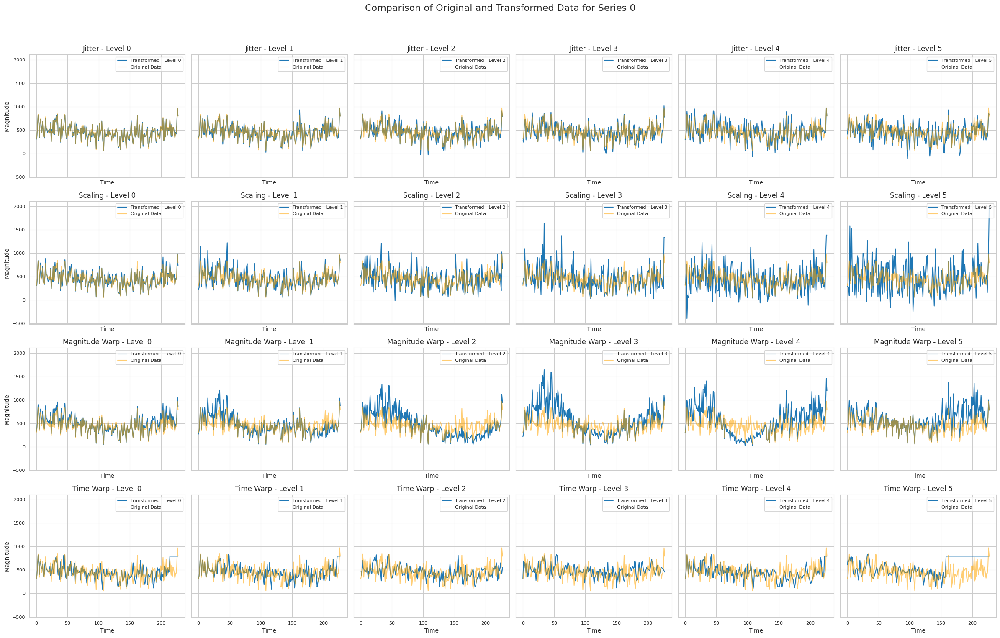

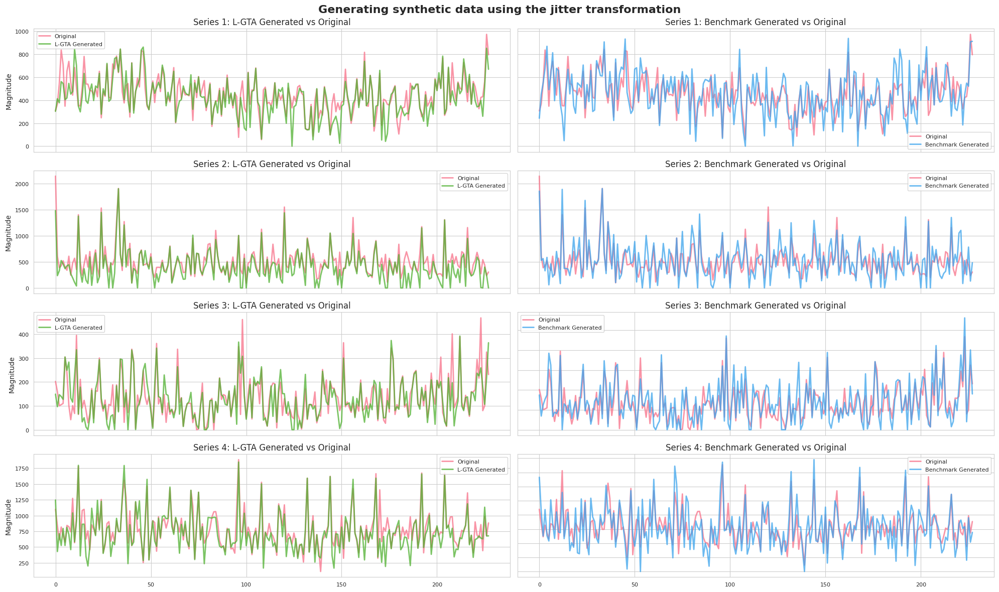

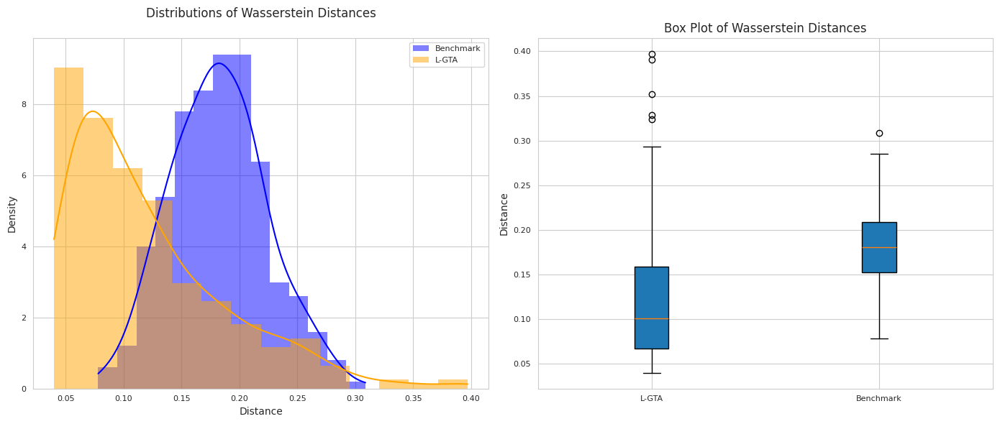

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


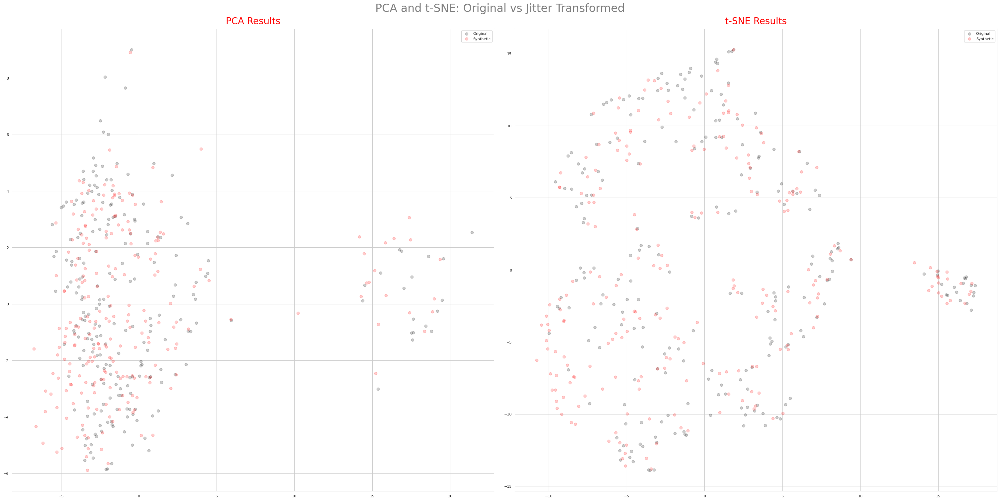

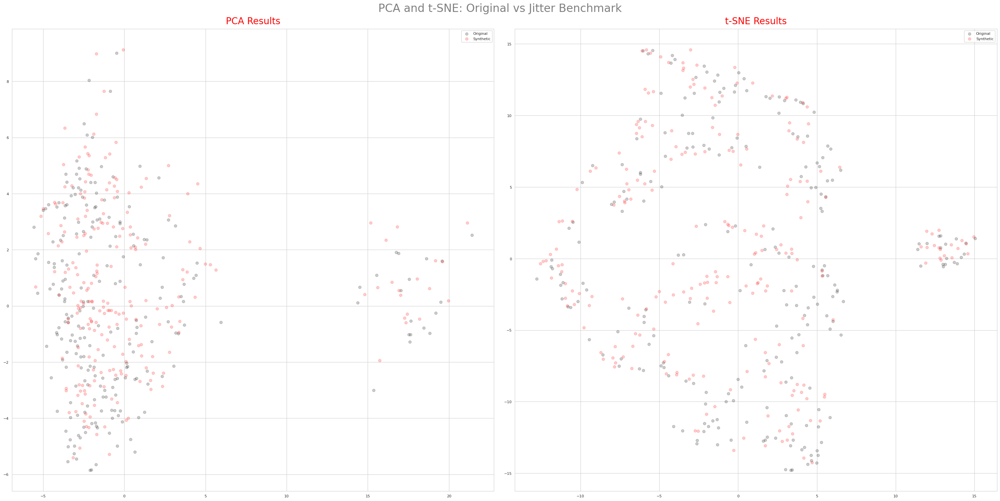

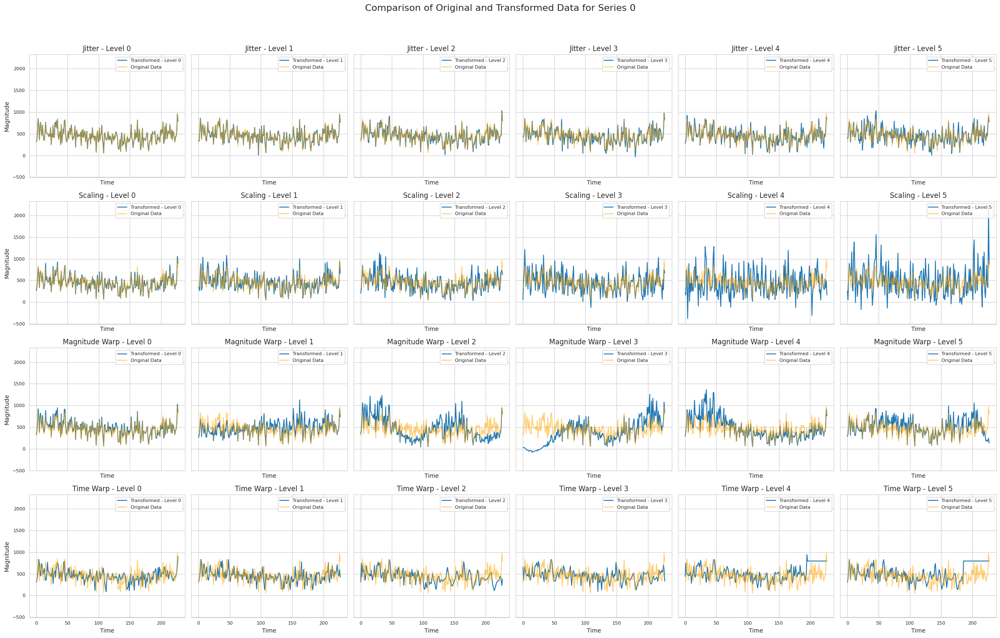

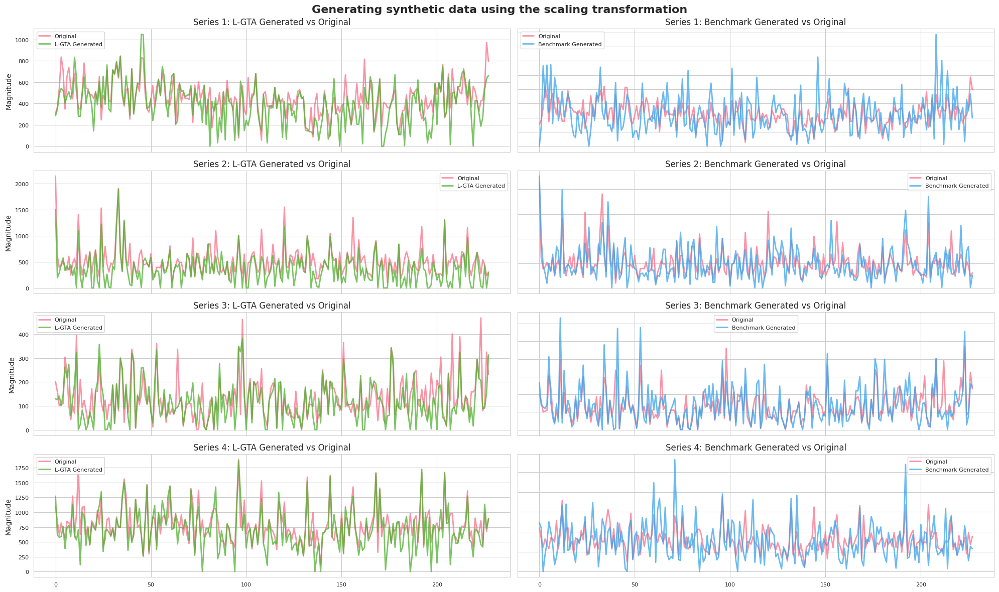

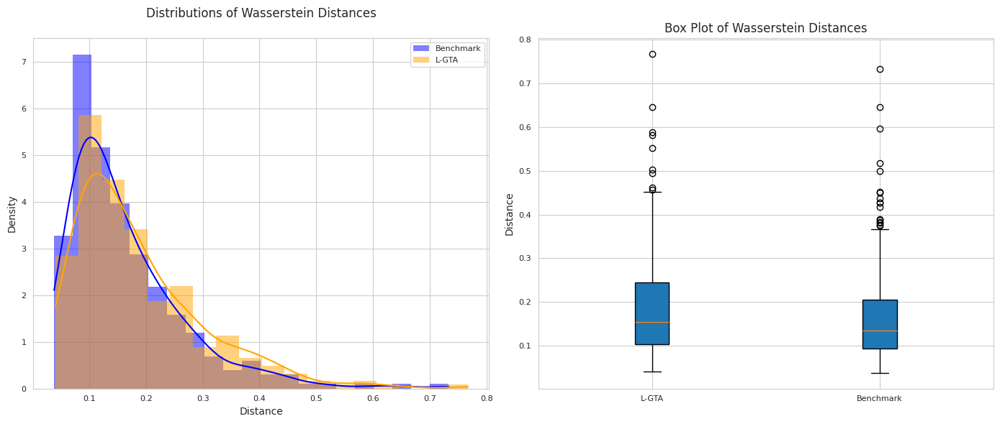

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


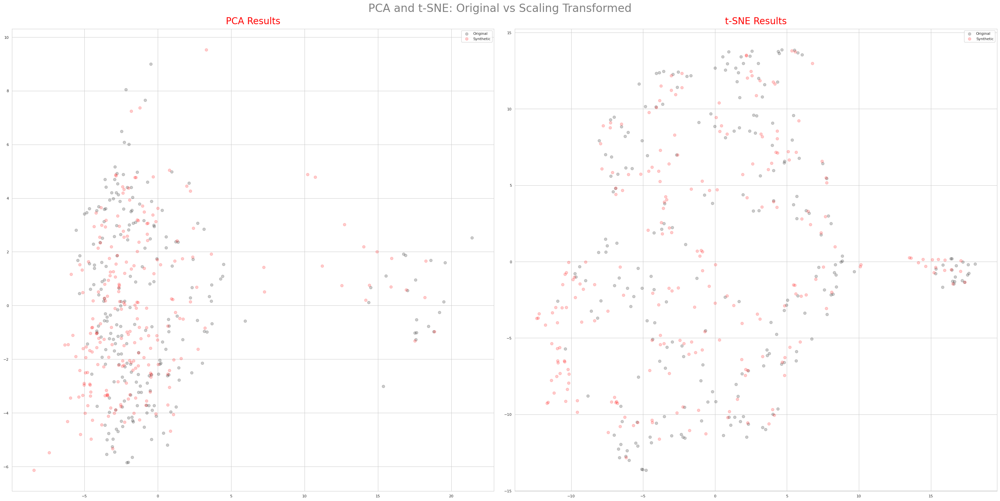

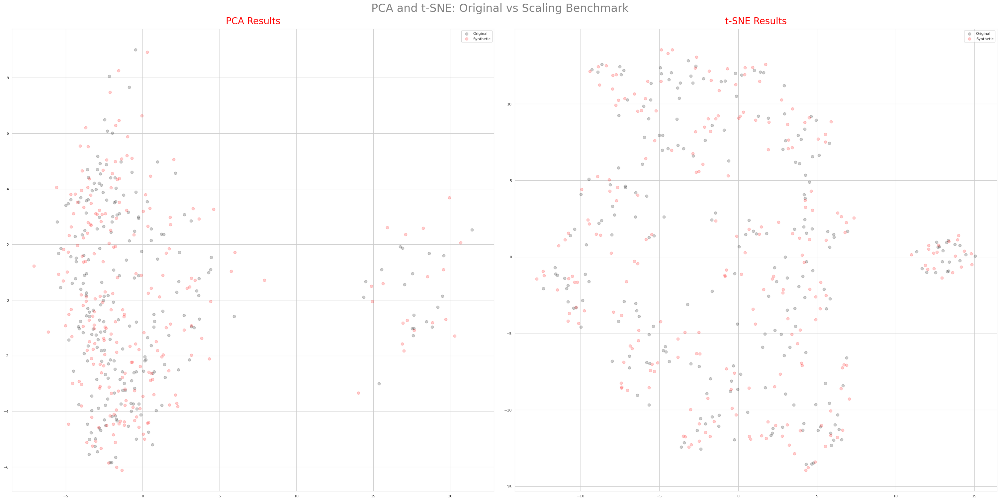

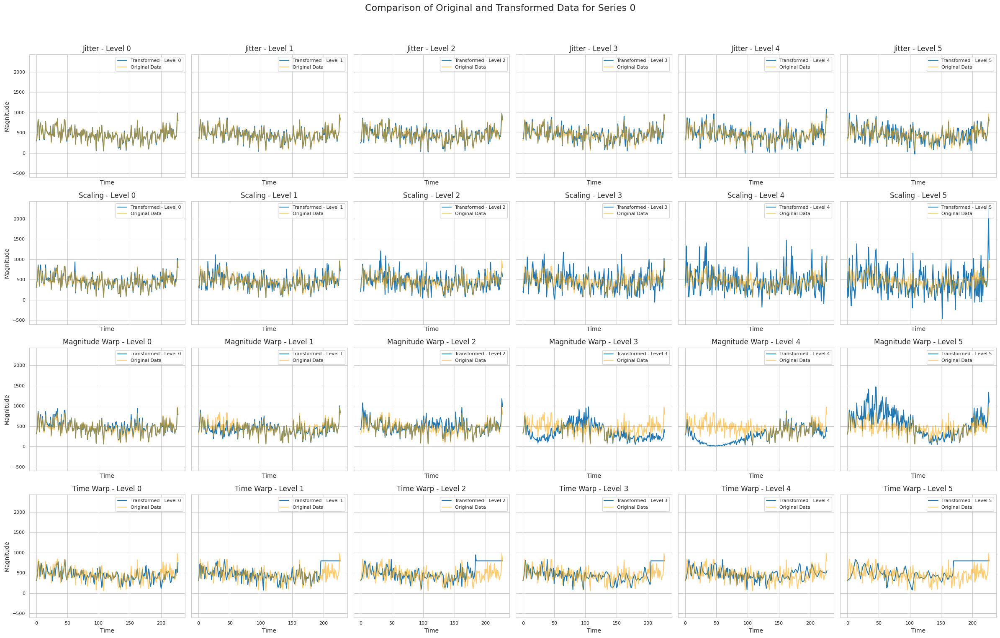

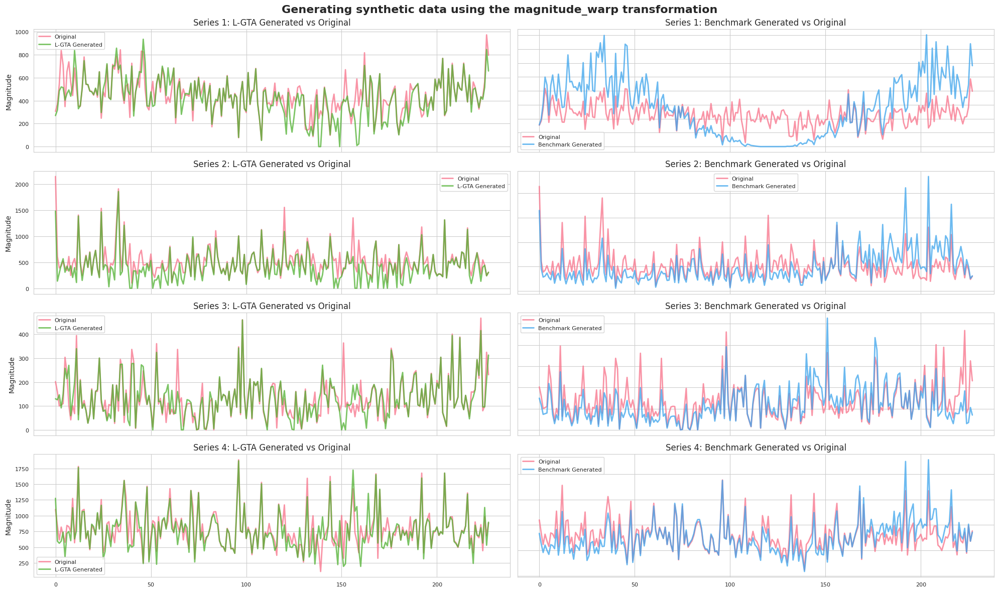

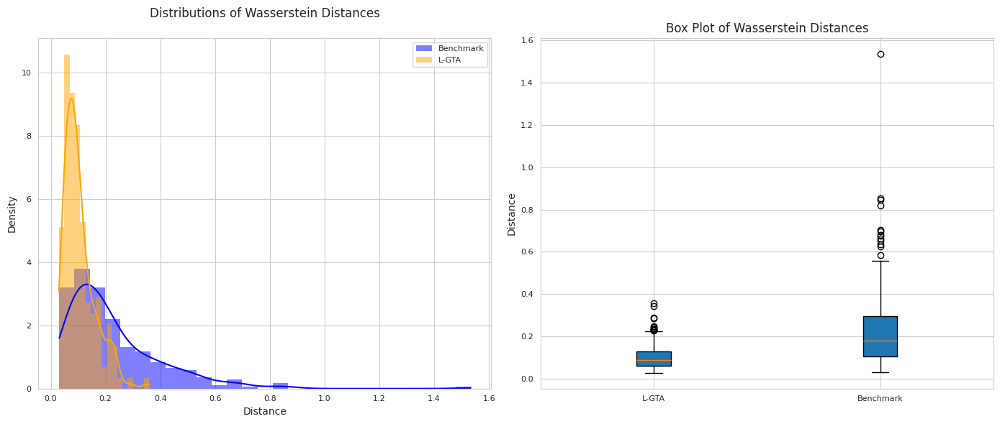

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


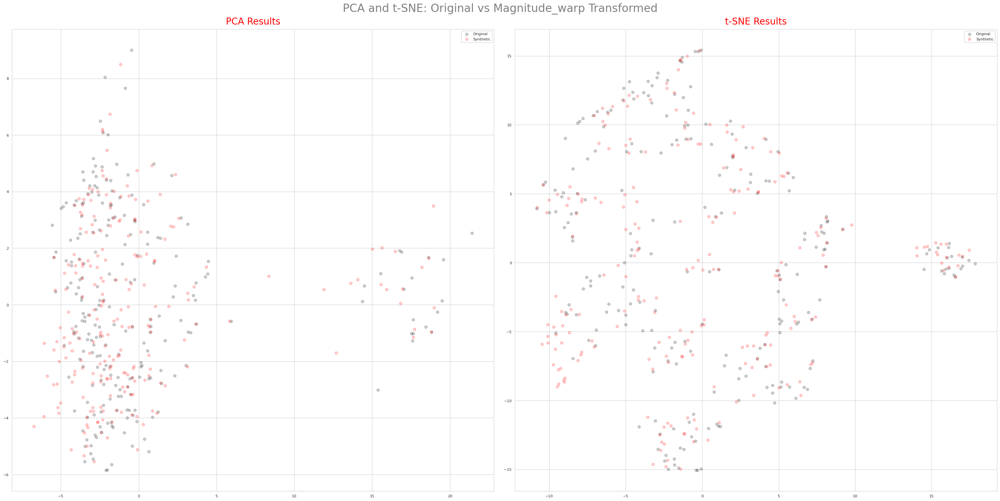

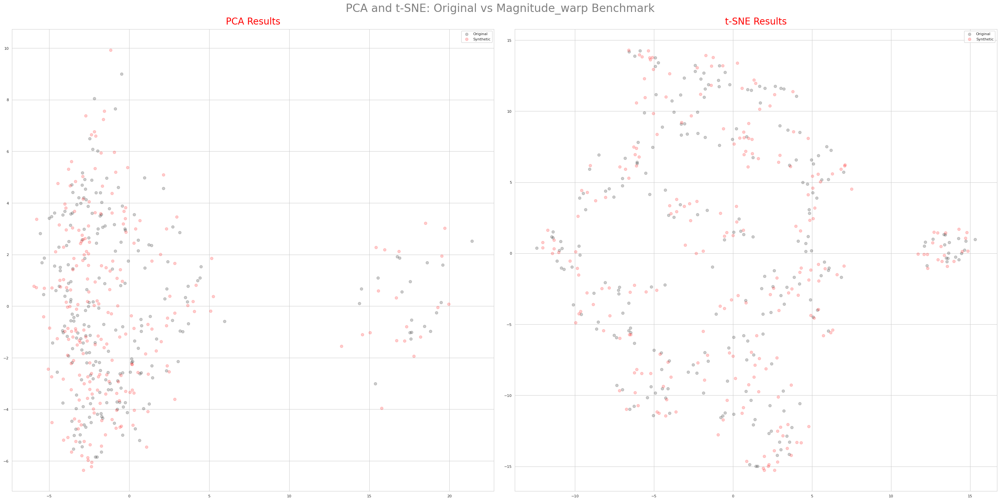

In [ ]:
results = {}
for transformation in transformations:
    results[transformation["transformation"]] = e2e_transformation(
        dataset,
        freq,
        model,
        z,
        create_dataset_vae,
        transformation["transformation"],
        transformation["params"],
        transformation["parameters_benchmark"],
        transformation["version"],
        X_orig,
        X_hat,
    )


### Cell 19: Process Results and Generate Analysis Datasets

***

#### Purpose

This cell processes raw experimental results from different data transformations, then creates and exports structured datasets for evaluating and comparing your model’s performance—specifically in terms of distance metrics, reconstruction error percentages, and prediction comparisons.

***

#### Detailed Notes

- `res_processed = process_transformations(results)`
  - This function takes all raw result outputs stored in the `results` dictionary (from each augmentation type, in previous cells), and processes them into a uniform, analysis-ready structure.
  - It may flatten nested dicts, extract core metrics, align series, and ensure all key values are accessible for export or deeper statistical analysis.

- `create_distance_metrics_dataset(res_processed)`
  - Computes and exports key **distance metrics** between original and generated (or augmented) time series. Common distance metrics for time series include:
      - Dynamic Time Warping (DTW): Measures similarity even if series are out of phase in time.
      - Euclidean Distance: Simple point-to-point difference.
      - Others: May support custom domain distances as well.
  - These metrics help quantify how similar or "realistic" generated series are compared to the originals, a standard step in model validation.[2][4]

- `create_reconstruction_error_percentage_dataset(res_processed)`
  - Calculates and stores the **percentage error of reconstruction**—typically the difference between the original and the reconstructed time series, normalized and reported as a percentage.
  - This shows, for each experiment, how closely the model can reproduce the actual data, a direct measure of model fidelity.[2]

- `create_prediction_comparison_dataset(res_processed)`
  - Generates a dataset aligning true (original) values with predicted outputs from each transformation and model run.
  - Useful for creating plots, summary tables, and additional post-hoc error analysis, supporting deeper examination of where models or transforms perform best or worst.[4][2]

***

#### Why This Matters

- Consolidating, structuring, and exporting your results allows for high-quality, traceable analysis—making it much easier to build tables, visualizations, or even prepare data for publication.[4][2]
- Organizing by metric (distance, error, prediction comparison) saves substantial time in later steps and ensures the evaluation is thorough and reproducible.
- These steps are widely recommended in machine learning and time series research for ensuring transparent, fair comparison between different model settings and augmentation methods.[6][2][4]

***

#### Summary

This cell processes the outputs from all your transformation experiments and generates well-structured metric datasets for distance analysis, error reporting, and prediction comparisons. This practice supports robust, transparent model assessment in time series research.

In [ ]:
res_processed = process_transformations(results)

create_distance_metrics_dataset(res_processed)
create_reconstruction_error_percentage_dataset(res_processed)
create_prediction_comparison_dataset(res_processed)


Transformation,jitter,magnitude_warp,scaling
Model,,,
Original,0.022,0.022,0.023
L-GTA,0.023,0.022,0.023
Benchmark,0.023,0.025,0.025


### Cell 20: Focused Analysis and Visualization for Jittered Data

***

#### Purpose

This cell conducts a detailed analysis for the **"jitter"** transformation, applying Gaussian noise augmentation to your time series. It generates the model outputs, calculates errors for both your model and a benchmark approach, and presents visual and statistical comparisons to understand how well your model reconstructs or handles jittered data.

***

#### Detailed Notes

- **Set Transformation Parameters**
  - `transformation = "jitter"` specifies the transformation type as jittering, which means random Gaussian noise will be added to the series. This kind of augmentation is used to make models more robust and simulate natural variability in real-world data.[2][6][8]
  - `params = [0.5]` defines the standard deviation of the noise.
  - `parameters_benchmark` holds the key reference settings for jitter, scaling, magnitude_warp, and time_warp, supporting fair benchmarking.

- **Generate Datasets**
  - Calls `generate_datasets(...)` with all settings and your trained model to obtain:
    - `X_orig`: The original, true time series.
    - `X_lgta`: The series output by your model after handling the jitter augmentation.
    - `X_benchmark`: The series generated by a simple benchmark transformation technique.

- **Calculate Residuals (Error)**
  - `standardize_and_calculate_residuals(X_orig, X_lgta, X_benchmark)` computes how much the model output and the benchmark differ from the original series, in standardized terms.

- **Visualization and Analysis**
  - `plot_series_comparisons(...)` shows a line-plot comparison: original vs. model output vs. benchmark for the jittered series.
  - `analyze_transformations(residuals_lgta, residuals_benchmark)` computes and likely displays summary error statistics for both approaches, helping you interpret quantitative performance under jittering.

***

#### Why This Matters

- Jittering is a common and recommended time series augmentation technique for simulating real-world conditions and regularizing machine learning models.[6][8][2]
- By focusing on one transformation at a time, you can more clearly see where your model performs well or needs improvement, without interference from other variables.
- Visual and quantitative comparison with a benchmark provides transparency about the strengths and weaknesses of both your model and the augmentation method, which is essential for scientific evaluation and reporting.

***

#### Summary

This cell applies the jitter transformation (adding Gaussian noise) to your time series, then analyzes and visualizes how well your model and a benchmark reconstruct or handle this augmentation. It provides everything you need—data, error metrics, and plots—to understand your model's performance for this crucial augmentation strategy.

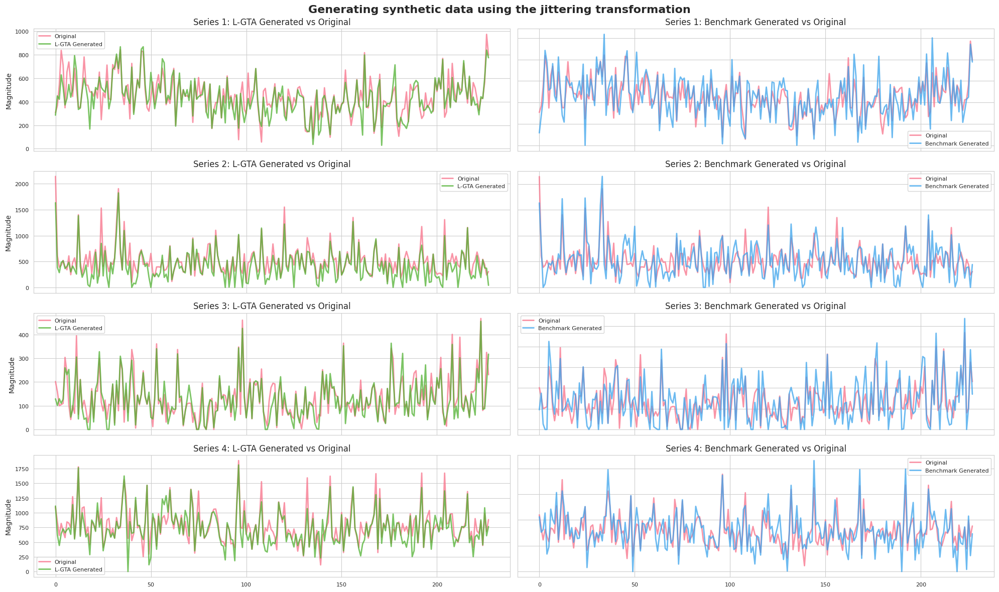

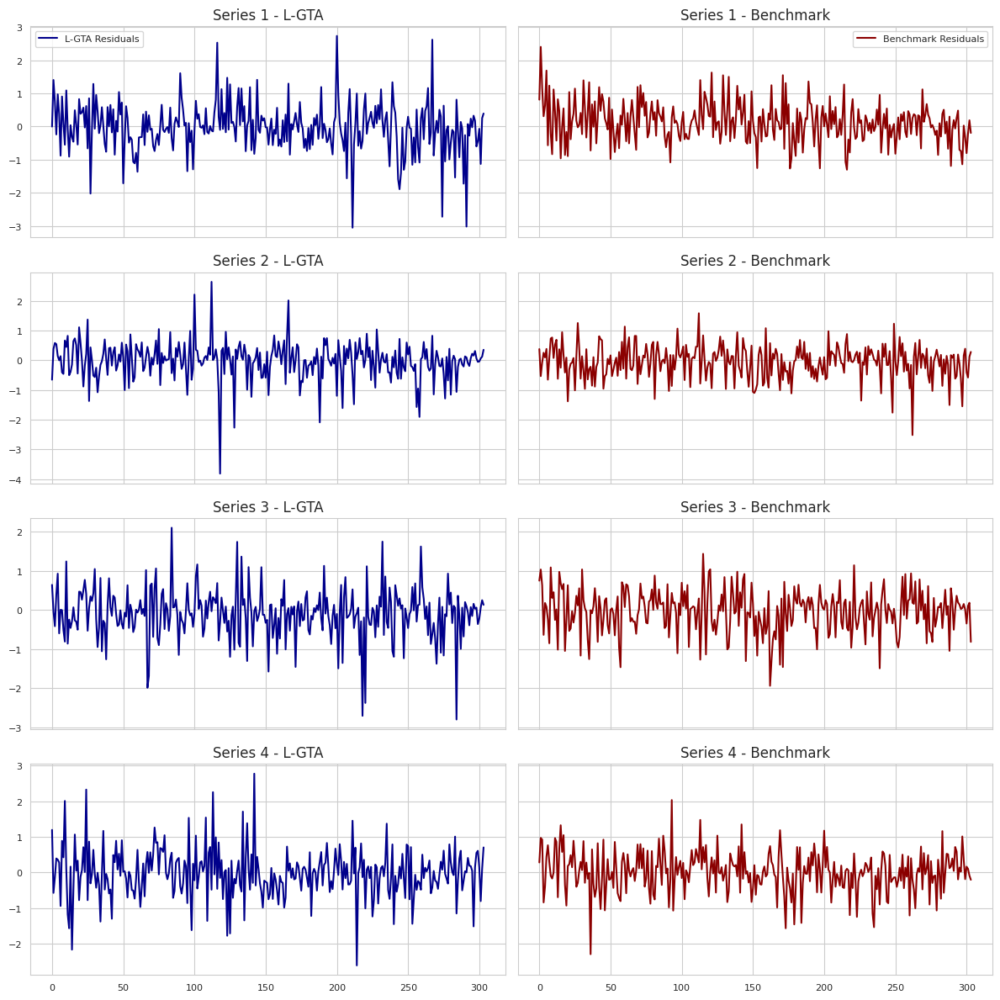

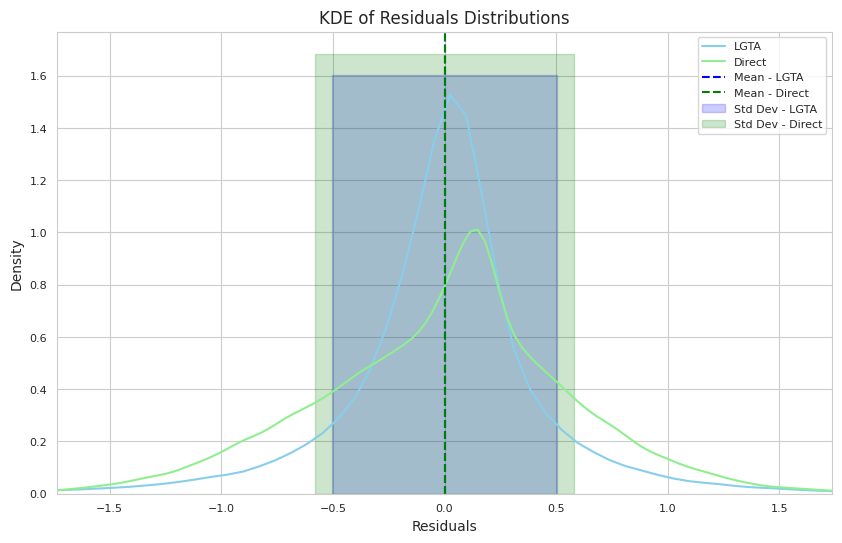

In [ ]:
transformation = "jitter"
params = [0.5]

parameters_benchmark = {
    "jitter": 0.5,
    "scaling": 0.1,
    "magnitude_warp": 0.1,
    "time_warp": 0.05,
}

version = 5

X_orig, X_lgta, X_benchmark = generate_datasets(
    dataset,
    freq,
    model,
    z,
    create_dataset_vae,
    X_orig,
    transformation,
    params,
    parameters_benchmark,
    version,
)
residuals_lgta, residuals_benchmark = standardize_and_calculate_residuals(
    X_orig, X_lgta, X_benchmark
)
plot_series_comparisons(X_orig, X_lgta, X_benchmark, "jittering")
analyze_transformations(residuals_lgta, residuals_benchmark)


### Cell 21: Jitter Magnitude Gradient Analysis—Error Trends Across Noise Levels

***

#### Purpose

This cell studies how your model and a benchmark's reconstruction errors change as you **increase the strength of jitter augmentation**. By running the experiment for several jitter magnitudes, you can plot and analyze sensitivities—seeing how robust your approach is and whether higher noise quickly degrades reconstruction quality.

***

#### Detailed Notes

- **Setup**  
  - `transformation = "jitter"`  
    Specifies that jitter (adding Gaussian noise) is being analyzed.
  - `params = [0.5, 0.6, 0.7, 0.8, 0.9]`  
    Lists five noise levels to try—these will be looped over for gradient analysis.
  - `parameters_benchmark = [...]`  
    Each jitter level gets a matching dictionary with standard parameter settings, making sure that every experiment is comparable to a reference benchmark.
  - `version = 5`  
    Tags this batch for reproducibility.

- **Result Aggregation**  
  - `residuals_lgta_all = []` and `residuals_benchmark_all = []`  
    Prepare empty lists to collect errors for each noise setting and each method (your model and the benchmark).

- **Main Loop**  
  For each parameter in `params`, the code:
    1. Calls `generate_datasets(...)` to get the original, model-reconstructed, and benchmark-generated time series for the current jitter level.
    2. Runs `standardize_and_calculate_residuals(...)` to get standardized (normalized) error values between original and generated/augmented series.
    3. Appends these error arrays to `residuals_lgta_all` and `residuals_benchmark_all`.

- **Visualization**  
     - `plot_residuals_gradient(residuals_lgta_all, residuals_benchmark_all, params)`  
      Creates a multi-series plot—typically with jitter magnitude on the x-axis and error metrics on the y-axis—making it easy to see trends and compare performance across all noise settings.

***

#### Why This Matters

- Testing models across a range of augmentation intensities is a critical robustness check; it shows whether a method holds up under increasingly difficult (noisy) conditions.[1][5]
- Comparing both your model and a benchmark reveals which approach "breaks" first and whether your improvements make a real difference at higher jitter levels.
- Gradient analysis is a standard in both academic and practical model tuning—helping detect the noise threshold that tips models into poor performance.

***

#### Summary

This cell sweeps through five increasing jitter noise settings, calculates error metrics for both your model and a benchmark, and visualizes how errors grow with noise intensity. This process helps you understand and document the robustness or sensitivity of your model to data augmentation, which is a foundational requirement in time series and signal processing research.


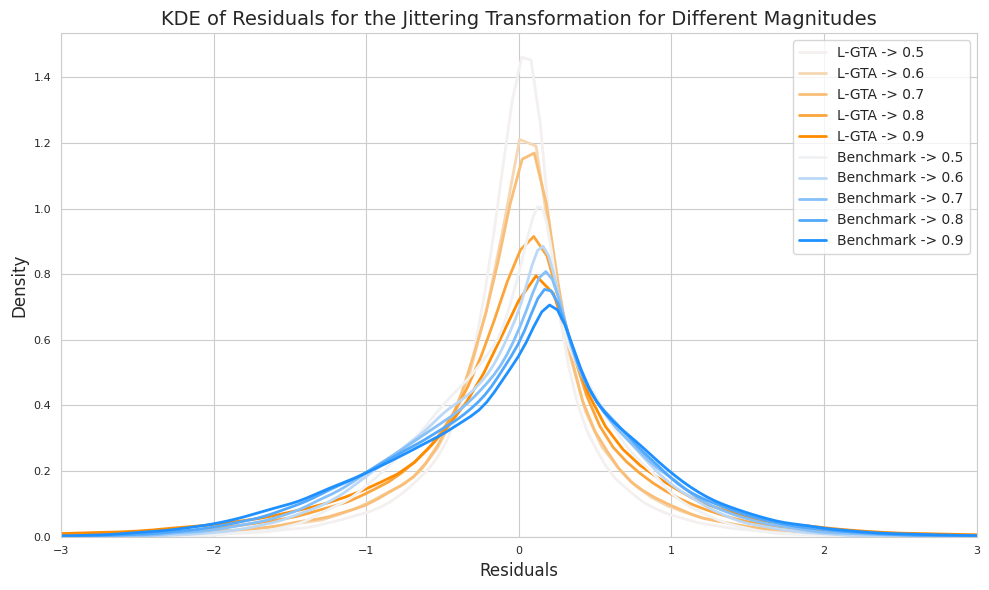

In [ ]:
transformation = "jitter"
params = [0.5, 0.6, 0.7, 0.8, 0.9]

parameters_benchmark = [
    {
        "jitter": 0.5,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.6,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.7,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.8,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.9,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
]

version = 5

residuals_lgta_all = []
residuals_benchmark_all = []

for i, param in enumerate(params):
    X_orig, X_lgta, X_benchmark = generate_datasets(
        dataset,
        freq,
        model,
        z,
        create_dataset_vae,
        X_orig,
        transformation,
        [param],
        parameters_benchmark[i],
        version,
    )
    residuals_lgta, residuals_benchmark = standardize_and_calculate_residuals(
        X_orig, X_lgta, X_benchmark
    )
    residuals_lgta_all.append(residuals_lgta)
    residuals_benchmark_all.append(residuals_benchmark)

plot_residuals_gradient(residuals_lgta_all, residuals_benchmark_all, params)
